In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
import os
import json
import pandas as pd
import numpy  as np

import matplotlib.pyplot as plt
import matplotlib.dates  as mdates

from datetime   import datetime, timezone
from legendmeta import LegendMetadata

from itertools import cycle

lmeta = LegendMetadata('/Users/romoluque_c/Repositories/legend-metadata/')

In [3]:
run_dict = {'p03':{'r000':{},'r001':{},'r002':{},'r003':{},'r004':{},'r005':{}},
            'p04':{'r000':{},'r001':{},'r002':{},'r003':{}},
            'p06':{'r000':{},'r001':{},'r002':{},'r003':{},'r004':{},'r005':{}},
            'p07':{          'r001':{},'r002':{},'r003':{},'r004':{},'r005':{},'r006':{},'r007':{}}}
            #'p08':{          'r001':{},'r002':{},'r003':{},'r004':{},'r005':{},'r006':{}}}

In [4]:
data_path = '/Users/romoluque_c/LEGEND/Energy_scale_group/Partitioning/data_example/'

In [5]:
dt    = datetime(2023, 4, 22, 5, 54, 22, tzinfo=timezone.utc)
chmap = lmeta.hardware.configuration.channelmaps.on(dt)
channel_dict = {}
for channel_name, channel_data in chmap.items():
    try:
        channel_dict[channel_data['daq']['rawid']] = (lmeta.channelmap(dt)[channel_name].type,
                                                      channel_name,
                                                      lmeta.channelmap(dt)[channel_name].production['mass_in_g'],
                                                      lmeta.channelmap(dt)[channel_name].location  ['string'],
                                                      lmeta.channelmap(dt)[channel_name].location  ['position'])
    except:
        continue

In [6]:
channel_dict;

In [7]:
for key, value in channel_dict.items():
    if value[0]== 'ppc':
        print(key, value)
    #if value[3]== 1:
    #    print(key, value)

1110404 ('ppc', 'P00574B', 778.9, 3, 3)
1110405 ('ppc', 'P00665A', 717.5, 3, 4)
1112000 ('ppc', 'P00698A', 962.0, 3, 5)
1112001 ('ppc', 'P00712A', 863.0, 3, 6)
1112002 ('ppc', 'P00909C', 882.9, 3, 7)
1112003 ('ppc', 'P00661B', 749.8, 3, 8)
1112004 ('ppc', 'P00574A', 764.0, 3, 9)
1080003 ('ppc', 'P00537A', 1043.6, 9, 5)
1080004 ('ppc', 'P00538A', 1037.9, 9, 6)
1080005 ('ppc', 'P00573A', 1051.7, 9, 7)
1081600 ('ppc', 'P00661C', 897.7, 9, 8)
1081601 ('ppc', 'P00662C', 749.2, 9, 9)
1081602 ('ppc', 'P00664A', 809.3, 9, 10)
1081603 ('ppc', 'P00665C', 845.0, 9, 11)
1081604 ('ppc', 'P00748B', 979.3, 9, 12)
1081605 ('ppc', 'P00909B', 825.1, 9, 13)
1088000 ('ppc', 'P00538B', 1025.2, 11, 4)
1088001 ('ppc', 'P00573B', 1067.8, 11, 5)
1088002 ('ppc', 'P00575A', 1055.4, 11, 6)
1088003 ('ppc', 'P00574C', 802.8, 11, 7)
1088004 ('ppc', 'P00661A', 693.7, 11, 8)
1089600 ('ppc', 'P00662A', 633.7, 11, 9)
1089601 ('ppc', 'P00662B', 625.7, 11, 10)
1089602 ('ppc', 'P00665B', 648.8, 11, 11)
1089603 ('ppc', 'P00

In [8]:
def cal_energy(e_uncal, cal_pars):
    if len(cal_pars.keys())==2:
        #print('lin')
        return cal_pars['a'] * e_uncal + cal_pars['b'], 'lin'
    elif len(cal_pars.keys())==3:
        #print('quad')
        return cal_pars['a'] * e_uncal **2 + cal_pars['b'] * e_uncal + cal_pars['c'], 'quad'

In [9]:
def uncal_quad(e_cal, cal_pars):
    return (-cal_pars['b']+np.sqrt(cal_pars['b']**2-2*cal_pars['a']*(cal_pars['c']-e_cal)))/(2*cal_pars['a'])

### Let's choose all the ICPC detectors

In [10]:
all_params_ch = {}
all_channels  = ['ch1110404', 'ch1110405', 'ch1112000', 'ch1112001', 'ch1112002', 'ch1112003', 'ch1112004',
                 'ch1080003', 'ch1080004', 'ch1080005', 'ch1081600', 'ch1081601', 'ch1081602', 'ch1081603',
                 'ch1081604', 'ch1081605', 'ch1088000', 'ch1088001', 'ch1088002', 'ch1088003', 'ch1088004',
                 'ch1089600', 'ch1089601', 'ch1089602', 'ch1089603', 'ch1089604']

err_channels = []
for sel_channel in all_channels:
    
    pars_per_ch = {'mus_peaks':        {}, 'mus_err_peaks':   {},
                   'fwhms_peaks':      {}, 'fwhms_err_peaks': {},
                   'ecals_peaks':      {},
                   'Qbb_fwhms_in_keV': [], 'Qbb_fwhms_err_in_keV': [],
                   'eres_lin_pars0':   [], 'eres_lin_pars0_err':   [],
                   'eres_lin_pars1':   [], 'eres_lin_pars1_err':   [],
                   'gains':            [], 'Qbb_fwhms_in_ADC':     []}
    
    for i, period in enumerate(run_dict.keys()):
        for j, run in enumerate(run_dict[period].keys()):
            all_files = os.listdir(data_path)
            filename  = data_path + [f for f in all_files if f.startswith(f'l200-{period}-{run}')][0]
            with open (filename, 'r') as filehandler:
                try:
                    results   = json.load(filehandler)
                    res_chn   = results[sel_channel]['results']['ecal']
        
                    ## Parameters for calibration
                    cal_parameters = results[sel_channel]['pars']['operations']['cuspEmax_ctc_cal']['parameters']
                    
                    ## Parameters for resolution curve
                    eres_lin_pars = res_chn['cuspEmax_ctc_cal']['eres_linear']
    
                    pars_per_ch['Qbb_fwhms_in_keV']    .append({f'{period}-{run}': eres_lin_pars['Qbb_fwhm_in_keV']})
                    pars_per_ch['Qbb_fwhms_err_in_keV'].append({f'{period}-{run}': eres_lin_pars['Qbb_fwhm_err_in_keV']})
                    pars_per_ch['eres_lin_pars0']      .append({f'{period}-{run}': eres_lin_pars['parameters']   ['a']})
                    pars_per_ch['eres_lin_pars0_err']  .append({f'{period}-{run}': eres_lin_pars['uncertainties']['a']})
                    pars_per_ch['eres_lin_pars1']      .append({f'{period}-{run}': eres_lin_pars['parameters']   ['b']})
                    pars_per_ch['eres_lin_pars1_err']  .append({f'{period}-{run}': eres_lin_pars['uncertainties']['b']})
                    pars_per_ch['gains']               .append({f'{period}-{run}': cal_parameters['b']})
                    pars_per_ch['Qbb_fwhms_in_ADC']    .append({f'{period}-{run}': uncal_quad(eres_lin_pars['Qbb_fwhm_in_keV'], cal_parameters)})
                    
                    fitted_peaks   = res_chn['cuspEmax_ctc_cal']['fitted_peaks']
                    peak_fits_pars = res_chn['cuspEmax_ctc_cal']['pk_fits']
                    
                    for peak in fitted_peaks:
                        if i==0 and j==0:
                            pars_per_ch['mus_peaks']      [peak] = {}
                            pars_per_ch['mus_err_peaks']  [peak] = {}
                            pars_per_ch['fwhms_peaks']    [peak] = {}
                            pars_per_ch['fwhms_err_peaks'][peak] = {}
                            pars_per_ch['ecals_peaks']    [peak] = {}
                            
                        pars_per_ch['mus_peaks']      [peak][f'{period}-{run}'] = peak_fits_pars[f'{peak}']['parameters_in_ADC']   ['mu']
                        pars_per_ch['mus_err_peaks']  [peak][f'{period}-{run}'] = peak_fits_pars[f'{peak}']['uncertainties_in_ADC']['mu']
                        pars_per_ch['fwhms_peaks']    [peak][f'{period}-{run}'] = peak_fits_pars[f'{peak}']['fwhm_in_keV']         [0]   
                        pars_per_ch['fwhms_err_peaks'][peak][f'{period}-{run}'] = peak_fits_pars[f'{peak}']['fwhm_in_keV']         [1]   
                        pars_per_ch['ecals_peaks']    [peak][f'{period}-{run}'] = cal_energy(peak_fits_pars[f'{peak}']['parameters_in_ADC']['mu'], cal_parameters)[0]
                except:
                    print(sel_channel, period, run)
                    err_channels.append(sel_channel)
                    continue

    all_params_ch[sel_channel] = pars_per_ch

ch1110405 p03 r000
ch1110405 p03 r001
ch1110405 p03 r002
ch1110405 p03 r003
ch1110405 p03 r004
ch1110405 p03 r005
ch1110405 p04 r000
ch1110405 p04 r001
ch1110405 p04 r002
ch1110405 p04 r003
ch1110405 p06 r000
ch1110405 p06 r001
ch1110405 p06 r002
ch1110405 p06 r003
ch1110405 p06 r004
ch1110405 p06 r005
ch1110405 p07 r001
ch1110405 p07 r002
ch1110405 p07 r003
ch1110405 p07 r004
ch1110405 p07 r005
ch1110405 p07 r006
ch1110405 p07 r007
ch1080003 p03 r000
ch1080003 p03 r001
ch1080003 p03 r002
ch1080003 p03 r003
ch1080003 p03 r004
ch1080003 p03 r005
ch1080003 p04 r000
ch1080003 p04 r001
ch1080003 p04 r002
ch1080003 p04 r003
ch1080003 p06 r000
ch1080003 p06 r001
ch1080003 p06 r002
ch1080003 p06 r003
ch1080003 p06 r004
ch1080003 p06 r005
ch1080003 p07 r001
ch1080003 p07 r002
ch1080003 p07 r003
ch1080003 p07 r004
ch1080003 p07 r005
ch1080003 p07 r006
ch1080003 p07 r007
ch1088000 p03 r000
ch1088000 p03 r001
ch1088000 p03 r002
ch1088000 p03 r003
ch1088000 p03 r004
ch1088000 p03 r005
ch1088000 p0

In [11]:
from collections import Counter

counted_values = Counter(err_channels)
for value, count in counted_values.items():
    print(f"{value}: {count} times")

ch1110405: 23 times
ch1080003: 23 times
ch1088000: 23 times
ch1088003: 1 times
ch1088004: 23 times
ch1089600: 1 times
ch1089601: 1 times
ch1089602: 23 times
ch1089603: 20 times
ch1089604: 23 times


In [12]:
labels = [f'{key}-{run}' for key in run_dict.keys() for run in run_dict[key].keys()]

### Position of the different peaks

In [13]:
all_fitted_peaks = np.array([583.191, 727.33, 860.564, 1592.53, 1620.5, 2103.53, 2614.5])

In [14]:
len(all_params_ch), np.round(len(all_params_ch)/3), int(np.ceil(len(all_params_ch)/3))

(26, 9.0, 9)

ch1110405 583.191
ch1080003 583.191
ch1088000 583.191
ch1088004 583.191
ch1089602 583.191
ch1089603 583.191
ch1089604 583.191


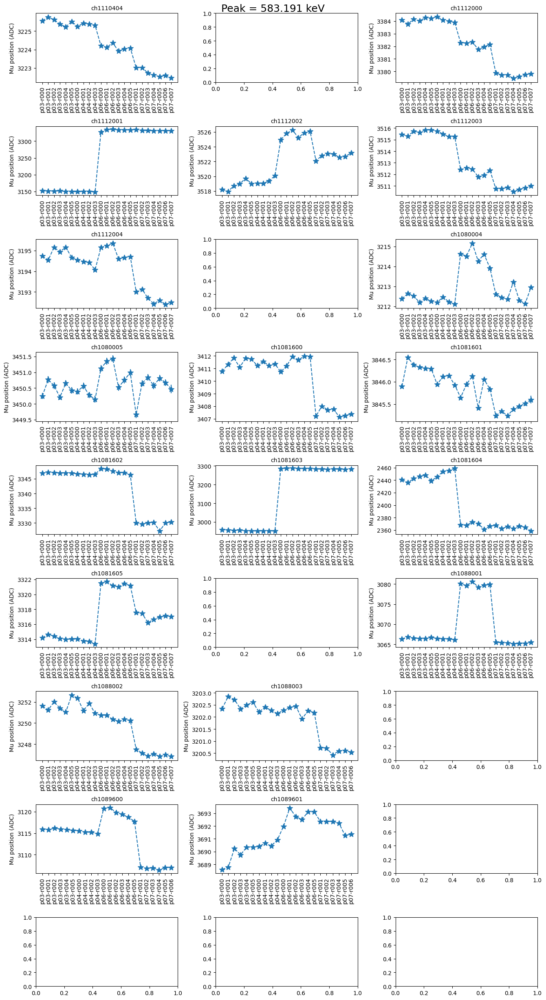


-------------------------------------------------------------------------------------------------

ch1110405 2103.53
ch1080003 2103.53
ch1088000 2103.53
ch1088004 2103.53
ch1089602 2103.53
ch1089603 2103.53
ch1089604 2103.53


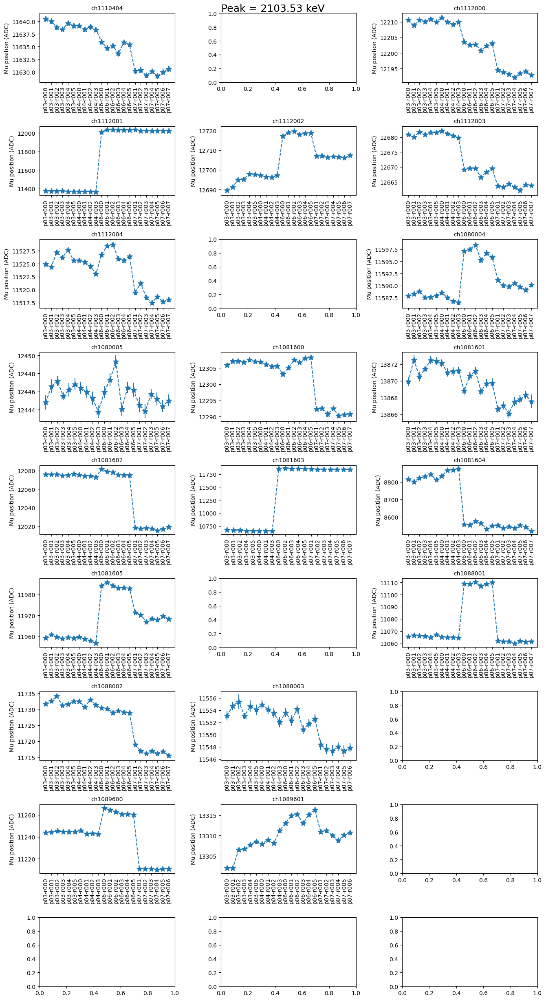


-------------------------------------------------------------------------------------------------

ch1110405 2614.5
ch1080003 2614.5
ch1088000 2614.5
ch1088004 2614.5
ch1089602 2614.5
ch1089604 2614.5


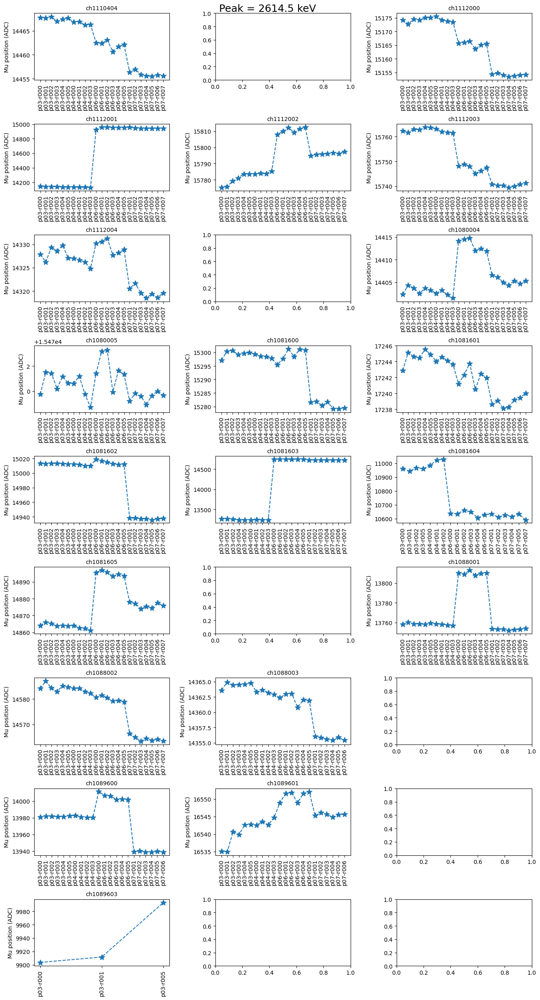


-------------------------------------------------------------------------------------------------



In [15]:
for peak in [all_fitted_peaks[0], all_fitted_peaks[5], all_fitted_peaks[6]]:
    fig, axs = plt.subplots(int(np.ceil(len(all_params_ch)/3)), 3, figsize=(13.5, 25))
    for i, (ax, channel) in enumerate(zip(axs.flatten(), all_params_ch.keys())):
        try:
            ax.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
                        list(all_params_ch[channel]['mus_peaks'][peak].values()),
                        yerr=list(all_params_ch[channel]['mus_err_peaks'][peak].values()), 
                        marker='*', linestyle='--', markersize=10, label=channel)
            ax.tick_params(axis='x', labelsize=10, rotation=90)
            ax.tick_params(axis='y', labelsize=10)
            ax.set_title(channel, fontsize=10)
            ax.set_ylabel('Mu position (ADC)', fontsize=10)
        except KeyError:
            print(channel, peak)
            continue
    fig.suptitle(f'Peak = {peak} keV', fontsize=18)
    plt.tight_layout()
    plt.show()
    print()
    print('-------------------------------------------------------------------------------------------------')
    print()

ch1110405 2614.5
ch1080003 2614.5
ch1088000 2614.5
ch1088004 2614.5
ch1089602 2614.5
ch1089604 2614.5


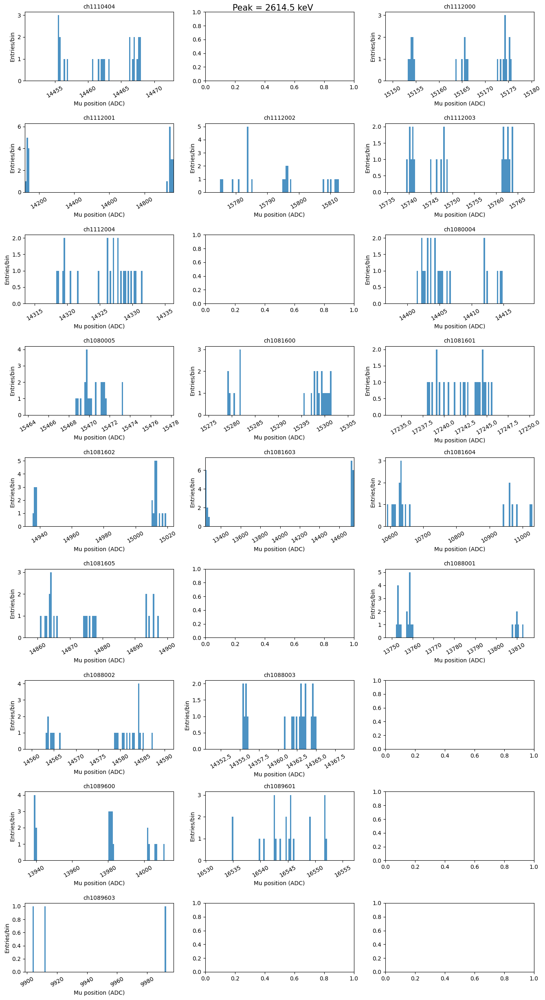

In [16]:
for peak in [all_fitted_peaks[6]]:
    fig, axs = plt.subplots(int(np.ceil(len(all_params_ch)/3)), 3, figsize=(13.5, 25))
    for i, (ax, channel) in enumerate(zip(axs.flatten(), all_params_ch.keys())):
        try:
            ax.hist(list(all_params_ch[channel]['mus_peaks'][peak].values()), bins=100, label=channel, alpha=0.8,
                   range=(min(list(all_params_ch[channel]['mus_peaks'][peak].values()))-5,
                          max(list(all_params_ch[channel]['mus_peaks'][peak].values()))+5))
            ax.tick_params(axis='x', labelsize=10, rotation=30)
            ax.tick_params(axis='y', labelsize=10)
            ax.set_xlim(min(list(all_params_ch[channel]['mus_peaks'][peak].values()))-5,
                        max(list(all_params_ch[channel]['mus_peaks'][peak].values()))+5)
            ax.set_title(channel, fontsize=10)
            ax.set_xlabel('Mu position (ADC)', fontsize=10)
            ax.set_ylabel('Entries/bin', fontsize=10)
        except KeyError:
            print(channel, peak)
            continue
    fig.suptitle(f'Peak = {peak} keV', fontsize=15)
    plt.tight_layout()
    plt.show()

### FEP FWHM for all the peaks

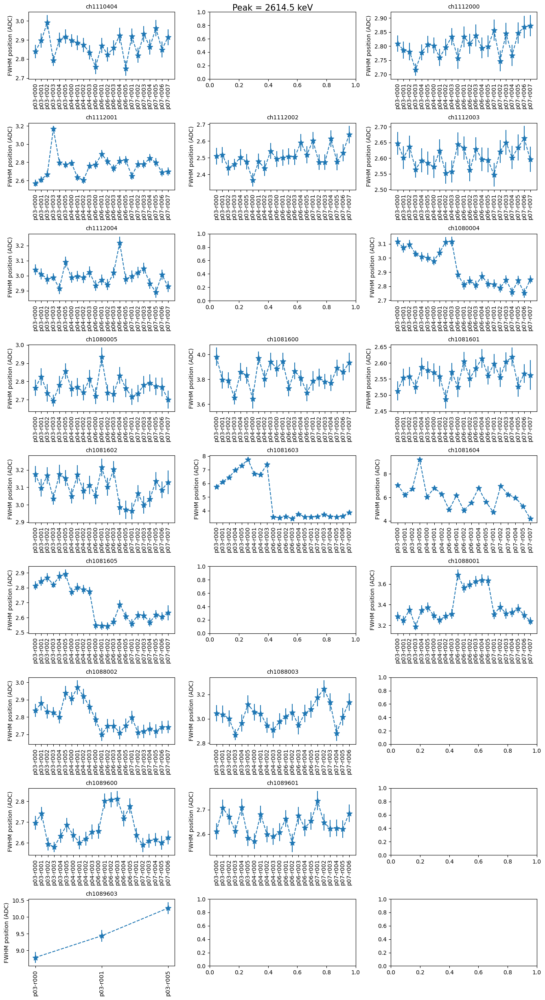

In [17]:
for peak in [all_fitted_peaks[6]]:
    fig, axs = plt.subplots(int(np.ceil(len(all_params_ch)/3)), 3, figsize=(13.5, 25))
    for i, (ax, channel) in enumerate(zip(axs.flatten(), all_params_ch.keys())):
        try:
            ax.errorbar(list(all_params_ch[channel]['fwhms_peaks'][peak].keys()), 
                        list(all_params_ch[channel]['fwhms_peaks'][peak].values()),
                        yerr=list(all_params_ch[channel]['fwhms_err_peaks'][peak].values()),
                        marker='*', linestyle='--', markersize=10, label=channel)
            ax.tick_params(axis='x', labelsize=10, rotation=90)
            ax.tick_params(axis='y', labelsize=10)
            ax.set_title(channel, fontsize=10)
            ax.set_ylabel('FWHM position (ADC)', fontsize=10)
        except KeyError:
            #print(channel, peak)
            continue
    fig.suptitle(f'Peak = {peak} keV', fontsize=15)
    plt.tight_layout()
    plt.show()

### Qbb res

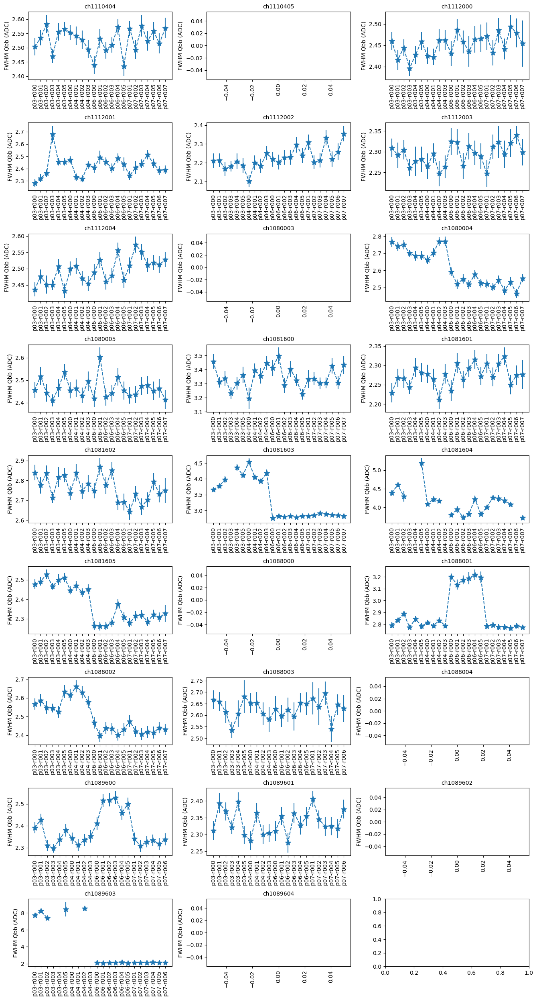

In [18]:
fig, axs = plt.subplots(int(np.ceil(len(all_params_ch)/3)), 3, figsize=(13.5, 25))
for i, (ax, channel) in enumerate(zip(axs.flatten(), all_params_ch.keys())):
    try:
        ax.errorbar([list(i.keys  ())[0] for i in all_params_ch[channel]['Qbb_fwhms_in_keV']],
                    [list(i.values())[0] for i in all_params_ch[channel]['Qbb_fwhms_in_keV']],
                    yerr=[list(i.values())[0] for i in all_params_ch[channel]['Qbb_fwhms_err_in_keV']],
                    marker='*', linestyle='--', markersize=10, label=channel)
        ax.tick_params(axis='x', labelsize=10, rotation=90)
        ax.tick_params(axis='y', labelsize=10)
        ax.set_title(channel, fontsize=10)
        ax.set_ylabel('FWHM Qbb (ADC)', fontsize=10)
    except KeyError:
        print(channel)
        continue
plt.tight_layout()
plt.show()

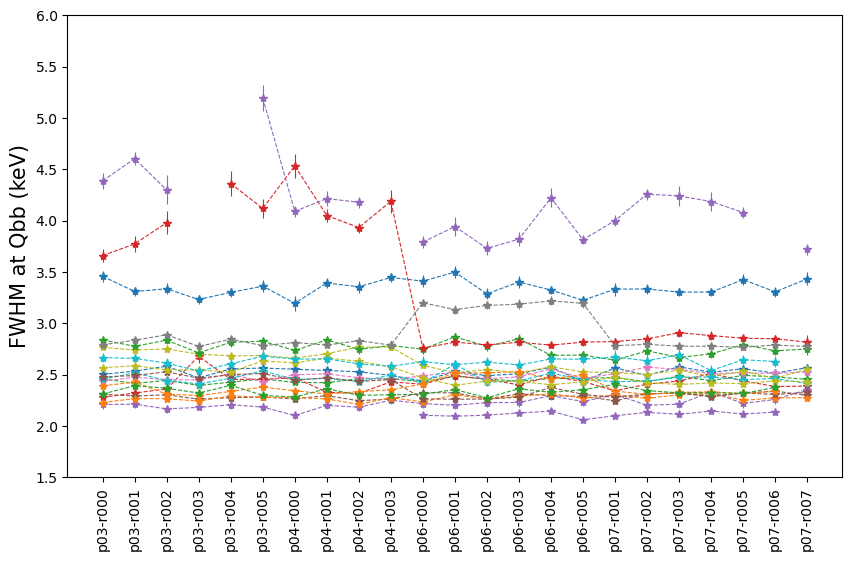

In [19]:
fig = plt.figure(figsize=(10, 6))
for channel in all_params_ch.keys():
    plt.errorbar([list(i.keys  ())[0] for i in all_params_ch[channel]['Qbb_fwhms_in_keV']],
                 [list(i.values())[0] for i in all_params_ch[channel]['Qbb_fwhms_in_keV']],
                 yerr=[list(i.values())[0] for i in all_params_ch[channel]['Qbb_fwhms_err_in_keV']],
                 marker='*', linestyle='--', markersize=6, label=channel, linewidth=0.8)
plt.xticks(rotation=90)
plt.ylabel('FWHM at Qbb (keV)', fontsize=15)
plt.ylim(1.5, 6)
#plt.legend(fontsize=12, ncol=2)
plt.show()

### Gain

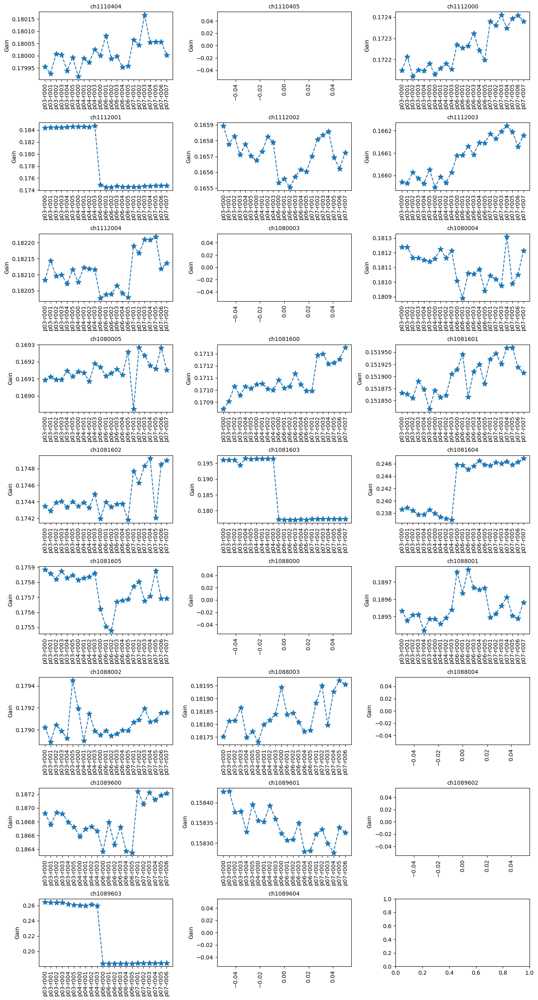

In [20]:
fig, axs = plt.subplots(int(np.ceil(len(all_params_ch)/3)), 3, figsize=(13.5, 25))
for i, (ax, channel) in enumerate(zip(axs.flatten(), all_params_ch.keys())):
    try:
        ax.errorbar([list(i.keys  ())[0] for i in all_params_ch[channel]['gains']],
                [list(i.values())[0] for i in all_params_ch[channel]['gains']],
                 marker='*', linestyle='--', markersize=10, label=f'Channel {channel}')
        ax.tick_params(axis='x', labelsize=10, rotation=90)
        ax.tick_params(axis='y', labelsize=10)
        ax.set_title(channel, fontsize=10)
        ax.set_ylabel('Gain', fontsize=10)
    except KeyError:
        print(channel)
        continue
plt.tight_layout()
plt.show()

### Residuals

ch1110405
ch1080003
ch1088000
ch1088004
ch1089602
ch1089604


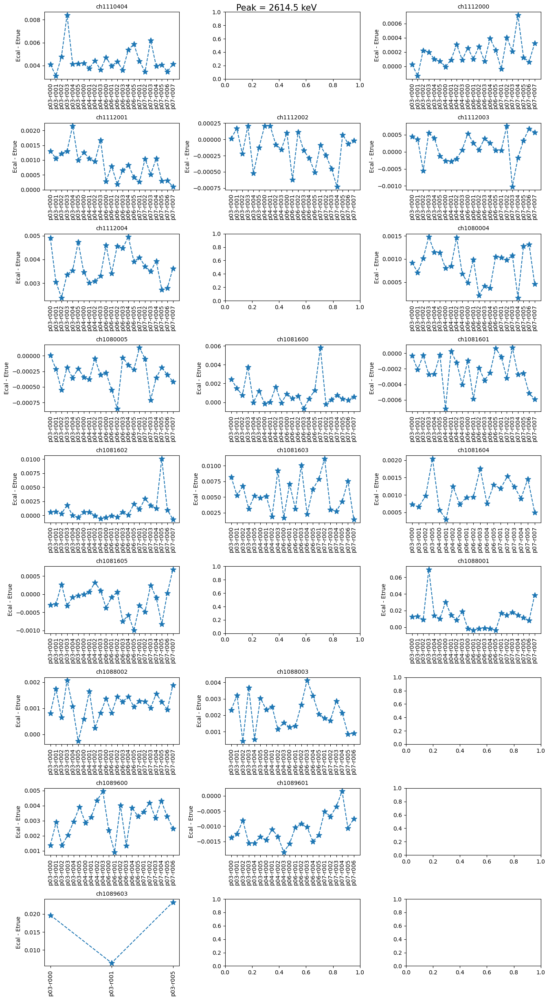

In [21]:
for peak in [all_fitted_peaks[6]]:
    fig, axs = plt.subplots(int(np.ceil(len(all_params_ch)/3)), 3, figsize=(13.5, 25))
    for i, (ax, channel) in enumerate(zip(axs.flatten(), all_params_ch.keys())):
        try:
            ax.errorbar(list(all_params_ch[channel]['ecals_peaks'][peak].keys()), 
                        np.array(list(all_params_ch[channel]['ecals_peaks'][peak].values())) - peak,
                        marker='*', linestyle='--', markersize=10, label=channel)
            ax.tick_params(axis='x', labelsize=10, rotation=90)
            ax.tick_params(axis='y', labelsize=10)
            ax.set_title(channel, fontsize=10)
            ax.set_ylabel('Ecal - Etrue', fontsize=10)
            fig.suptitle(f'Peak = {peak} keV', fontsize=15)
        except KeyError:
            print(channel)
            continue
    plt.tight_layout()
    plt.show()

ch1110405
ch1080003
ch1088000
ch1088004
ch1089602
ch1089603
ch1089604


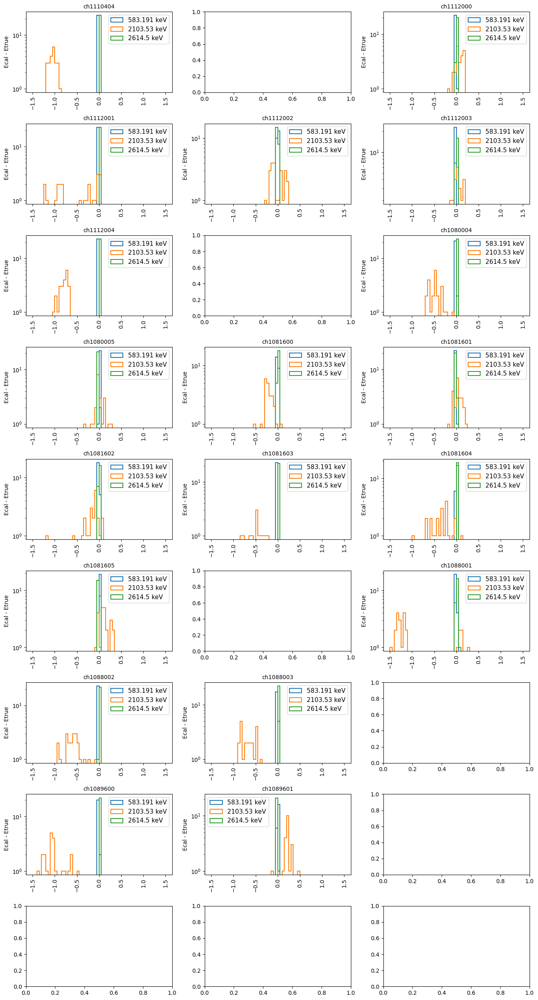

In [22]:
fig, axs = plt.subplots(int(np.ceil(len(all_params_ch)/3)), 3, figsize=(13.5, 25))
for i, (ax, channel) in enumerate(zip(axs.flatten(), all_params_ch.keys())):
    try:
        for peak in [all_fitted_peaks[0], all_fitted_peaks[5], all_fitted_peaks[6]]:
            ax.hist(np.array(list(all_params_ch[channel]['ecals_peaks'][peak].values())) - peak, bins=60, range=(-1.5, 1.5), histtype='step', linewidth=1.5, label=f'{peak} keV')
                
        ax.tick_params(axis='x', labelsize=10, rotation=90)
        ax.tick_params(axis='y', labelsize=10)
        ax.set_title(channel, fontsize=10)
        ax.set_ylabel('Ecal - Etrue', fontsize=10)
        #ax.set_xlim(-0.5, 0.5)
        ax.set_yscale('log')
        ax.legend(fontsize=11)
    except KeyError:
        print(channel)
        continue
plt.tight_layout()
plt.show()

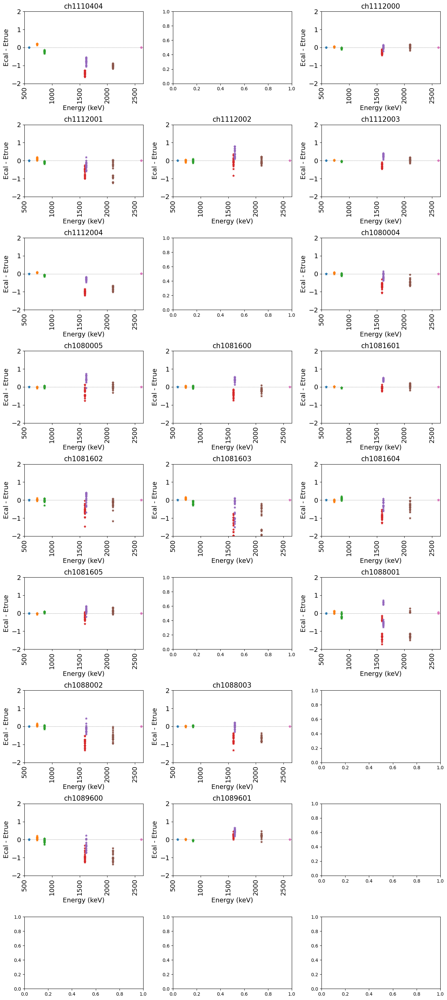

In [23]:
fig, axs = plt.subplots(int(np.ceil(len(all_params_ch)/3)), 3, figsize=(13.5, 30))
for i, (ax, channel) in enumerate(zip(axs.flatten(), all_params_ch.keys())):
    try:
        ax.axhline(y=0, linestyle='--', linewidth=0.5, color='grey')
        for i, peak in enumerate(all_fitted_peaks):
            ax.scatter(np.full(len(all_params_ch[channel]['ecals_peaks'][peak].values()), peak), np.array(list(all_params_ch[channel]['ecals_peaks'][peak].values())) - peak, marker='*', s=20)
        ax.tick_params(axis='x', labelsize=14, rotation=90)
        ax.tick_params(axis='y', labelsize=14)
        ax.set_xlabel('Energy (keV)', fontsize=14)
        ax.set_ylabel('Ecal - Etrue', fontsize=14)
        ax.set_title(channel, fontsize=15)
        ax.set_xlim(500, 2650)
        ax.set_ylim(-2, 2)
    except KeyError:
        continue
plt.tight_layout()
plt.show()

### Gain and mu position

ch1110405
ch1080003
ch1088000
ch1088004
ch1089602
ch1089604


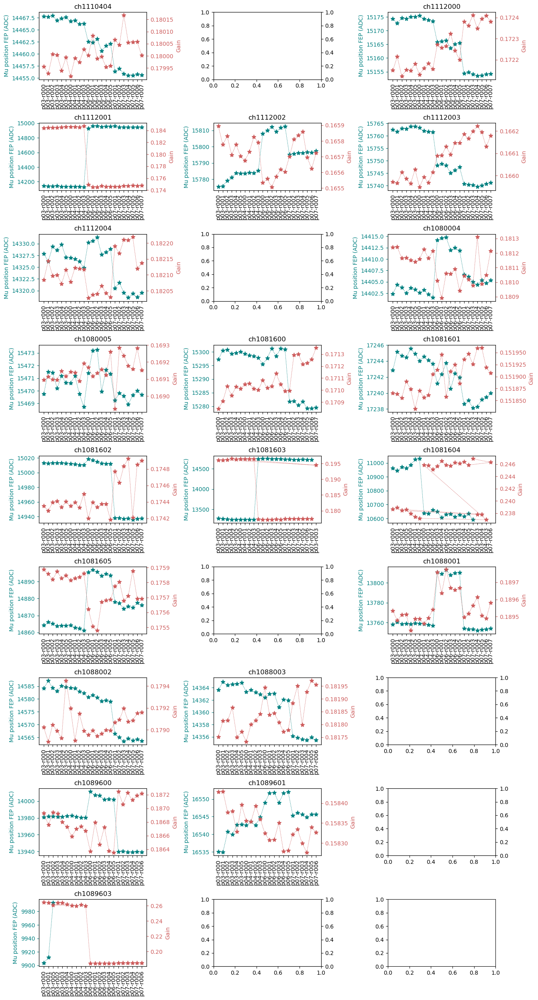

In [24]:
fig, axs = plt.subplots(int(np.ceil(len(all_params_ch)/3)), 3, figsize=(13.5, 25))
for i, (ax, channel) in enumerate(zip(axs.flatten(), all_params_ch.keys())):
    try:
        ax2 = ax.twinx()
        ax.errorbar(list(all_params_ch[channel]['mus_peaks'][2614.5].keys()), 
                     list(all_params_ch[channel]['mus_peaks'][2614.5].values()),
                     yerr=list(all_params_ch[channel]['mus_err_peaks'][2614.5].values()), 
                     marker='*', linestyle='--', markersize=8, label=channel, color='teal', linewidth=0.5)
        
        ax2.errorbar([list(i.keys  ())[0] for i in all_params_ch[channel]['gains']],
                    [list(i.values())[0] for i in all_params_ch[channel]['gains']],
                     marker='*', linestyle='--', markersize=8, label=f'Channel {channel}', color='indianred', linewidth=0.5)
        ax.tick_params(axis='x', labelsize=10, rotation=90)
        ax.tick_params( axis='y', labelsize=10, colors='teal')
        ax2.set_ylabel('Gain', color='indianred')
        ax2.tick_params(axis='y', labelsize=10, colors='indianred')
        
        
        ax.set_ylabel('Mu position FEP (ADC)', color='teal')
        ax.tick_params(axis='x', labelsize=10, rotation=90)
        ax.set_title(channel)
        #ax.set_ylim(0.146, 0.16)
    except KeyError:
        print(channel)
        continue
plt.tight_layout()
plt.show()

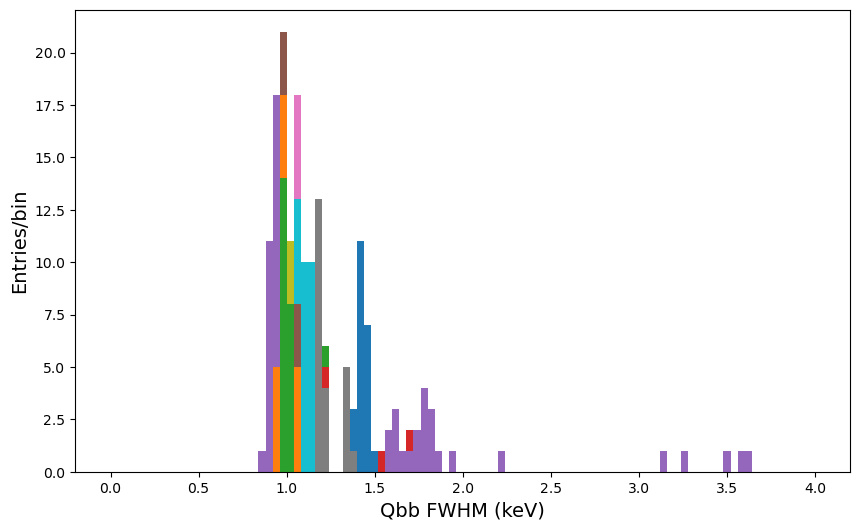

In [25]:
fig = plt.figure(figsize=(10, 6))
for channel in all_params_ch.keys():
    Qbb_fwhm_ch   = np.array([list(el.values())[0] for el in all_params_ch[channel]['Qbb_fwhms_in_keV']])
    Qbb_fwhm_keys = np.array([list(el.keys  ())[0] for el in all_params_ch[channel]['Qbb_fwhms_in_keV']])
    plt.hist(Qbb_fwhm_ch/2.355, bins=100, range=(0, 4), label=channel+f', $\sigma$ = {np.round(np.mean(Qbb_fwhm_ch/2.355), decimals=2)} keV')
plt.xlabel('Qbb FWHM (keV)', fontsize=14)
plt.ylabel('Entries/bin', fontsize=14)
plt.show()

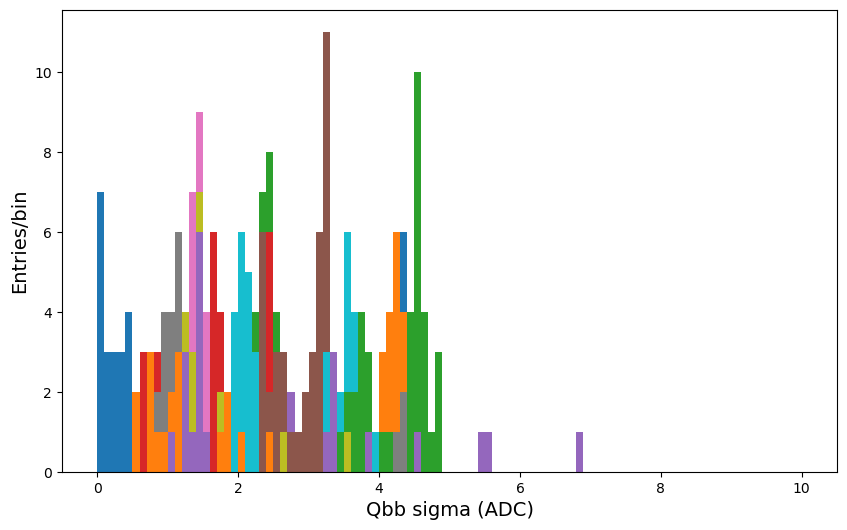

In [26]:
fig = plt.figure(figsize=(10, 6))
for channel in all_params_ch.keys():
    Qbb_fwhm_uncal = np.array([list(el.values())[0] for el in all_params_ch[channel]['Qbb_fwhms_in_ADC']])
    Qbb_sig_uncal  = Qbb_fwhm_uncal/2.355
    plt.hist(Qbb_sig_uncal, bins=100, range=(0, 10), label=channel)
plt.xlabel('Qbb sigma (ADC)', fontsize=14)
plt.ylabel('Entries/bin', fontsize=14)
#plt.legend(fontsize=12)
plt.show()

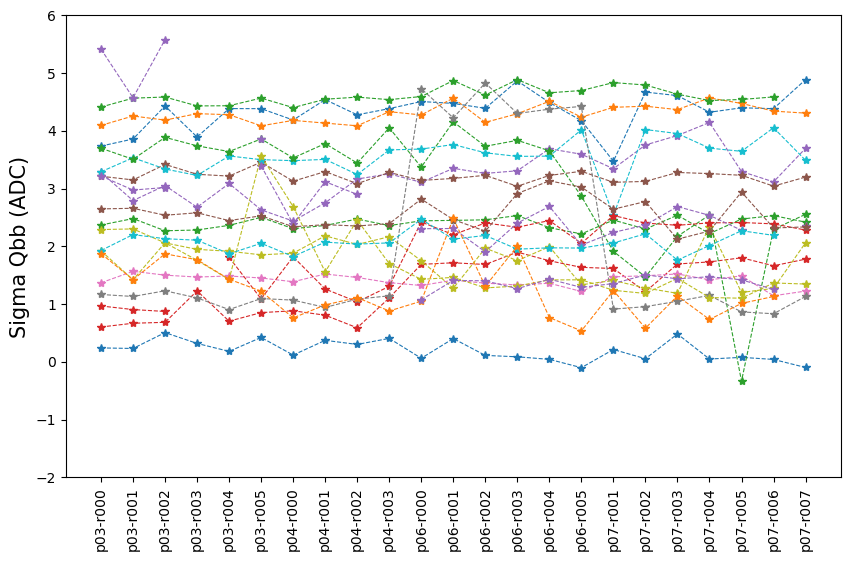

26


In [27]:
fig = plt.figure(figsize=(10, 6))
for channel in list(all_params_ch.keys()):
    Qbb_fwhm_uncal = np.array([list(el.values())[0] for el in all_params_ch[channel]['Qbb_fwhms_in_ADC']])
    Qbb_sig_uncal  = Qbb_fwhm_uncal/2.355
    plt.errorbar([list(i.keys  ())[0] for i in all_params_ch[channel]['Qbb_fwhms_in_ADC']],
                 Qbb_sig_uncal, marker='*', linestyle='--', markersize=6, label=channel, linewidth=0.8)
plt.xticks(rotation=90)
plt.ylabel('Sigma Qbb (ADC)', fontsize=15)
plt.ylim(-2, 6)
#plt.legend(fontsize=12, ncol=2)
plt.show()
print(len(all_params_ch.keys()))

In [28]:
def compute_and_plot_partition(channel, peak, col='teal', ylim=''):
    mus    = list(all_params_ch[channel]['mus_peaks'][peak].values())
    sigmas = np.array([list(el.values())[0] for el in all_params_ch[channel]['Qbb_fwhms_in_ADC']])/2.355
    
    partition_change = [0]
    start_mu = 0
    for i,(mu,sig) in enumerate(zip(mus, sigmas)):
        if i==0:
            start_mu = mu
        else:
            if np.abs(mu - start_mu) > np.abs(sig):
                partition_change.append(i)
            start_mu = mu
    partition_change.append(len(mus)-1)
    
    fig, ax = plt.subplots(1, 1, figsize=(7, 4))
    det_type = channel_dict[int(channel[2:])][0]
    det_name = channel_dict[int(channel[2:])][1]
    ax.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
                list(all_params_ch[channel]['mus_peaks'][peak].values()),
                yerr=list(all_params_ch[channel]['mus_err_peaks'][peak].values()), 
                marker='*', linestyle='--', markersize=10, label=det_type, color=col)
    
    color_list   = ['teal', 'grey', 'orange', 'indianred']
    cycle_colors = cycle(color_list)

    for i,col in zip(range(len(partition_change)-1), cycle_colors):
        ax.axvspan(list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change[i]], 
                   list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change[i+1]], alpha=0.2, color=col)
    ax.tick_params(axis='x', labelsize=14, rotation=90)
    ax.tick_params(axis='y', labelsize=13)
    ax.set_title(f'{det_type}, ({det_name})', fontsize=15)
    ax.set_ylabel('Mu position (ADC)', fontsize=15)
    if ylim:
        ax.set_ylim(ylim[0], ylim[1])
    else:
        ax.set_ylim(np.mean(list(all_params_ch[channel]['mus_peaks'][peak].values()))-25,
                    np.mean(list(all_params_ch[channel]['mus_peaks'][peak].values()))+25)
        
    plt.show()

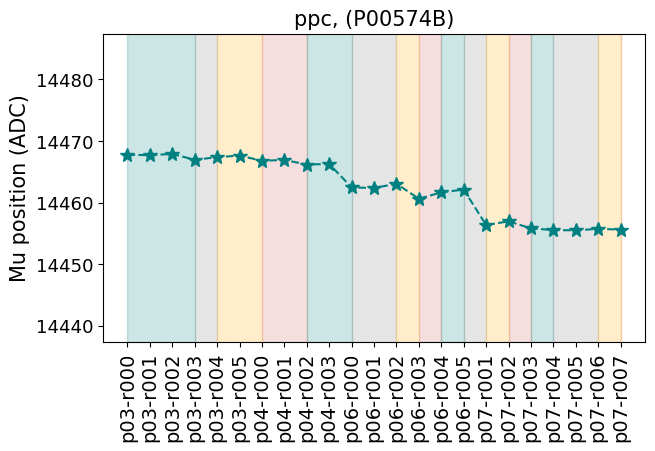

ch1110405


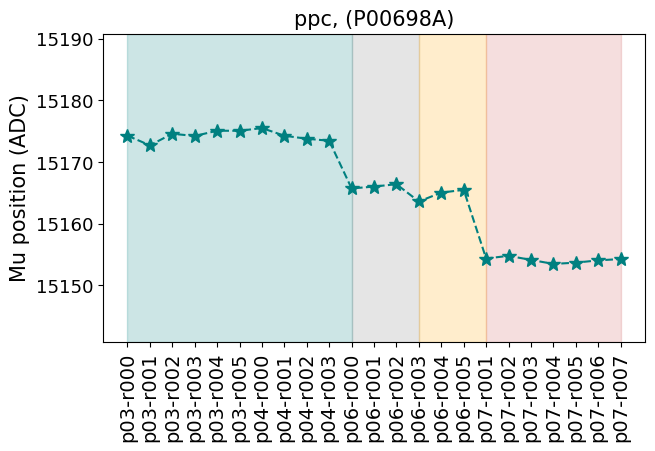

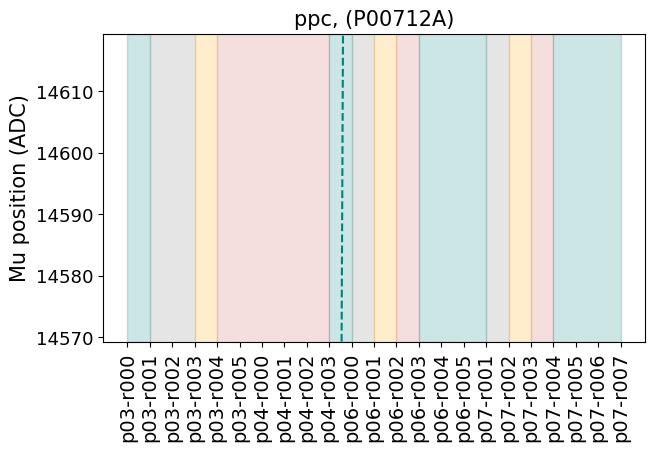

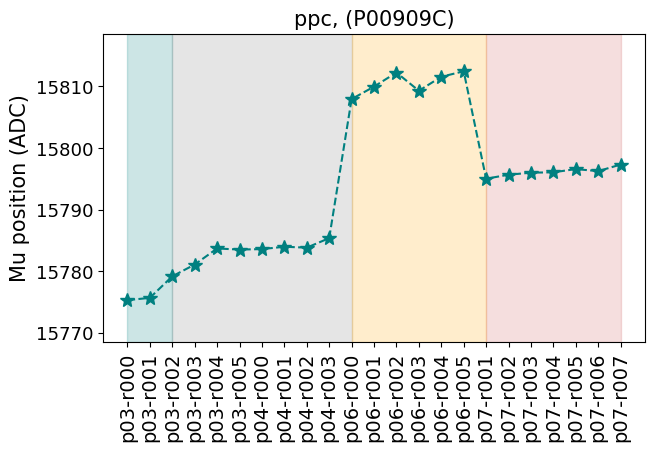

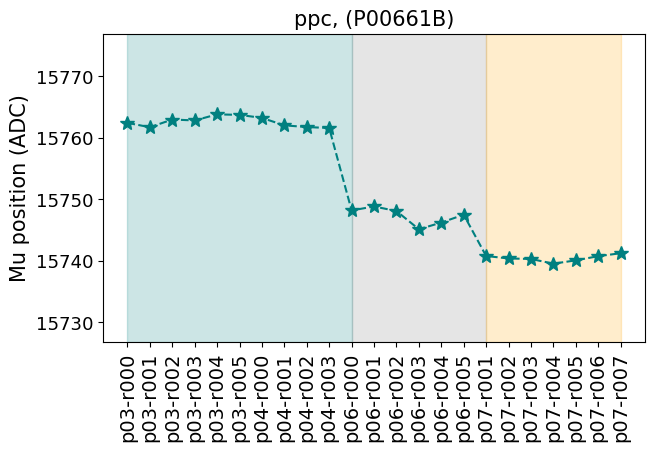

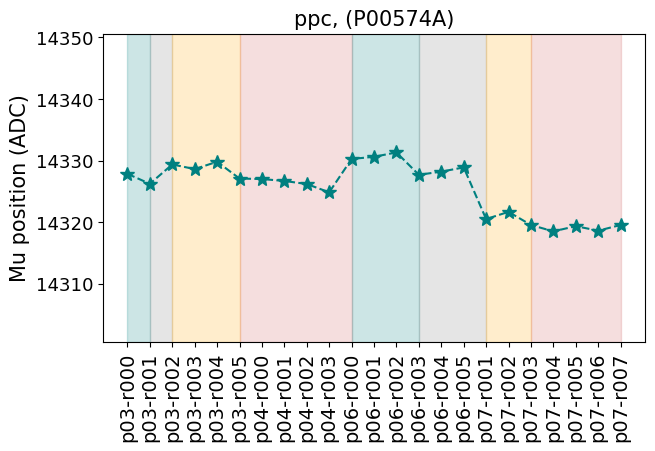

ch1080003


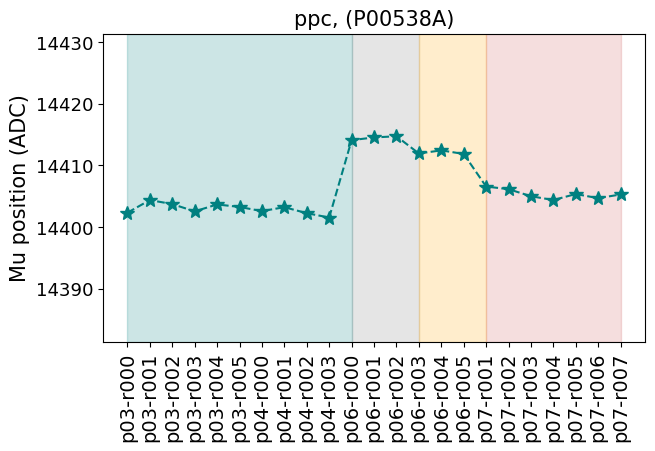

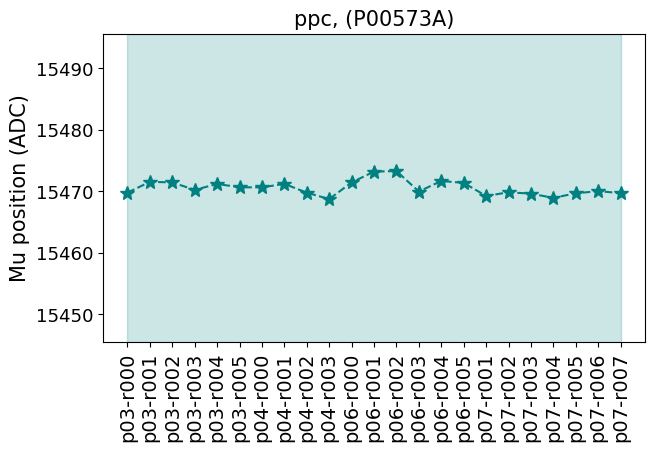

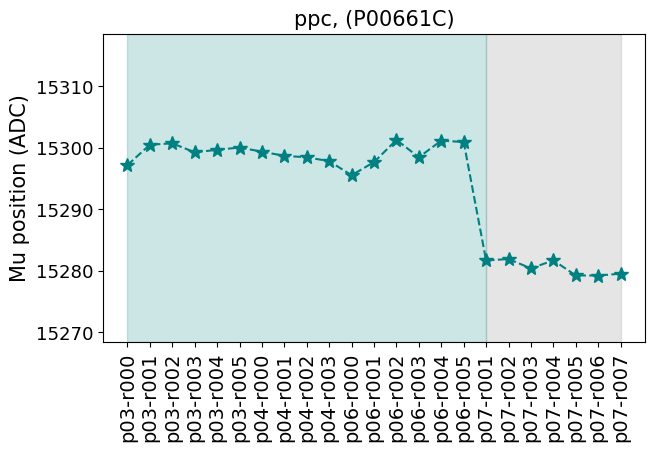

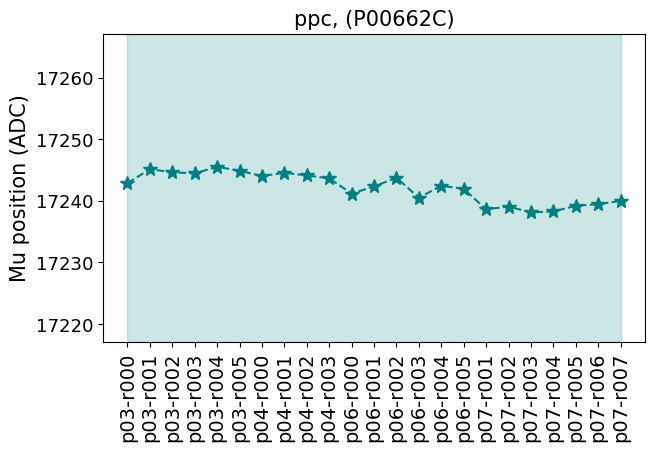

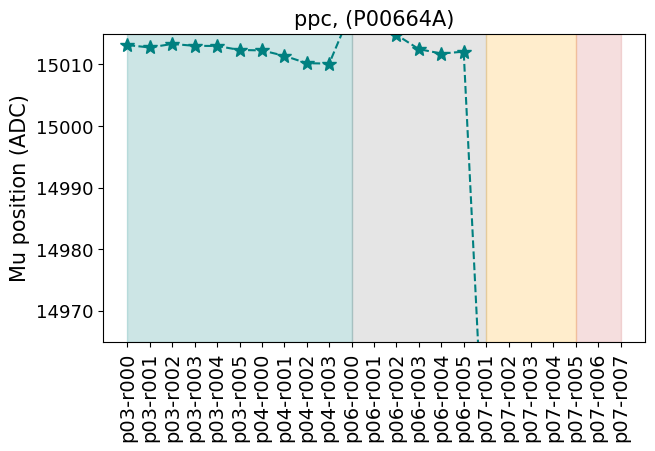

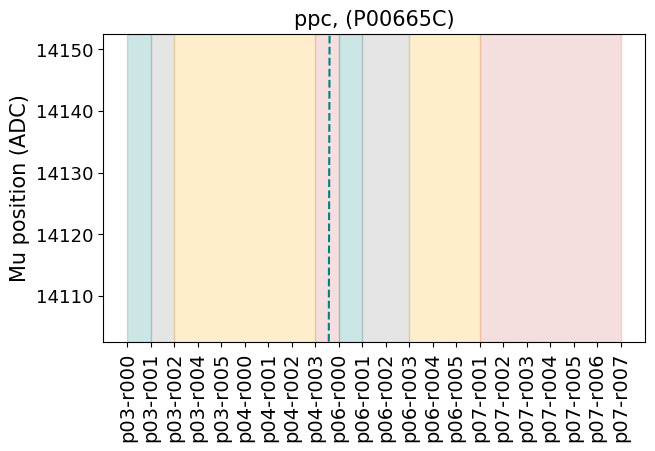

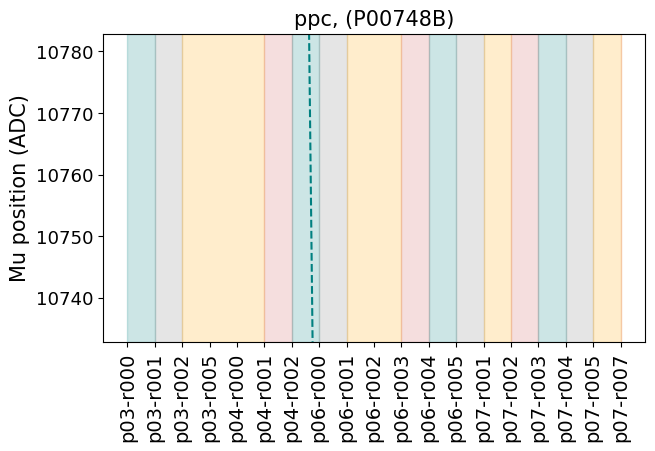

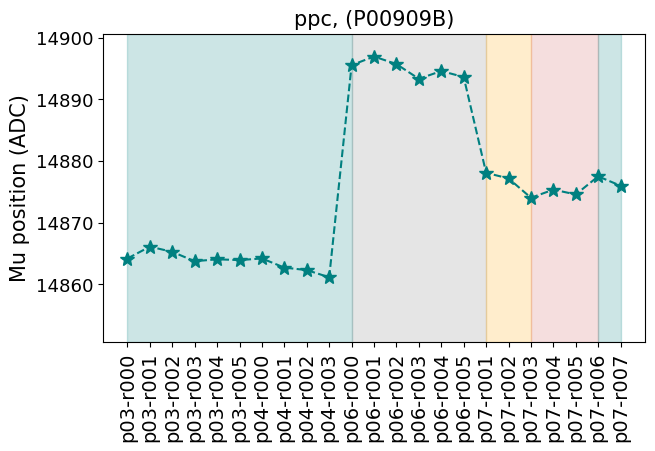

ch1088000


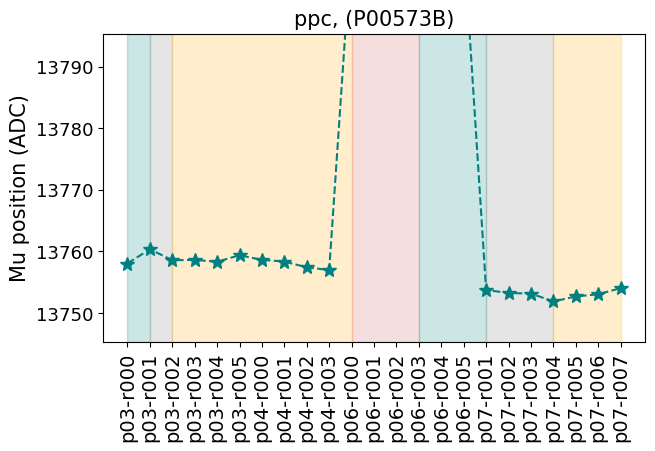

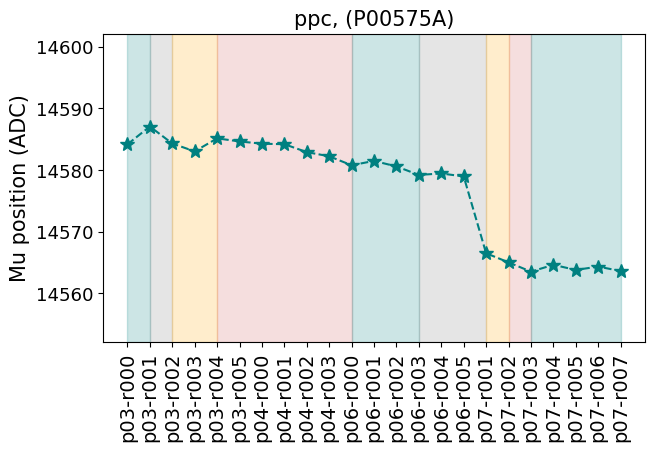

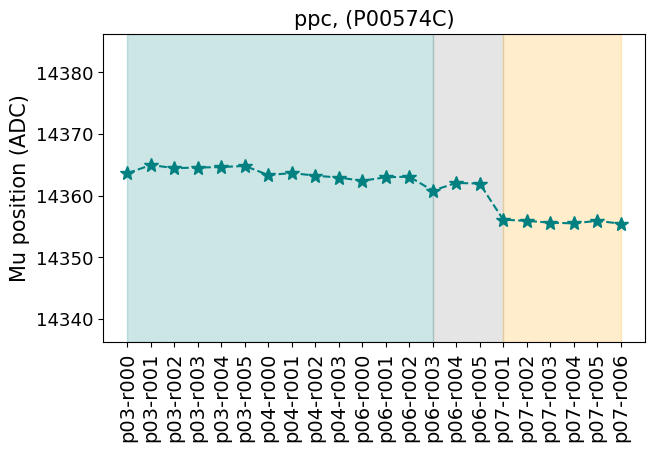

ch1088004


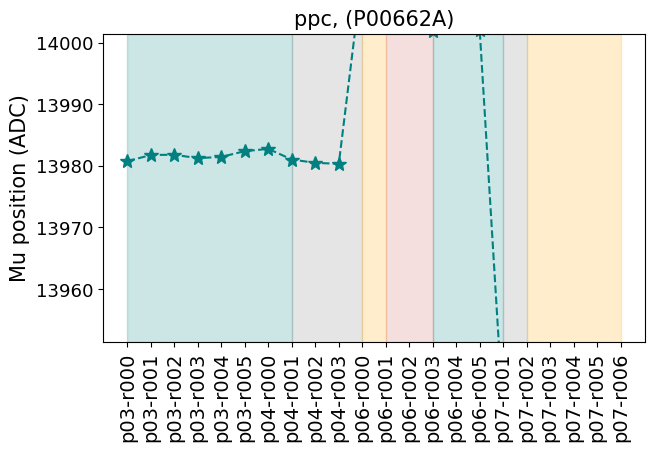

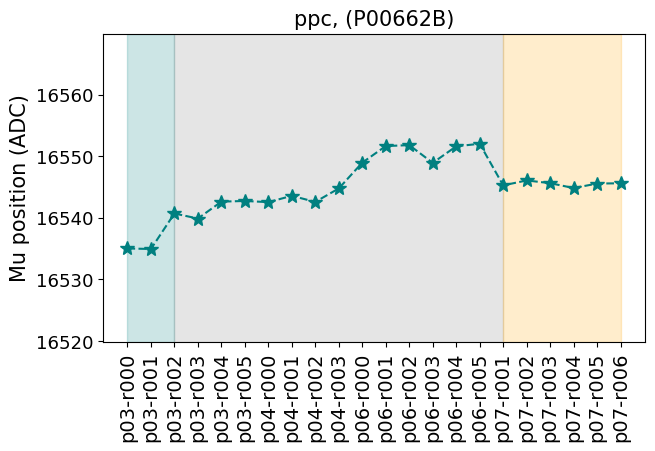

ch1089602


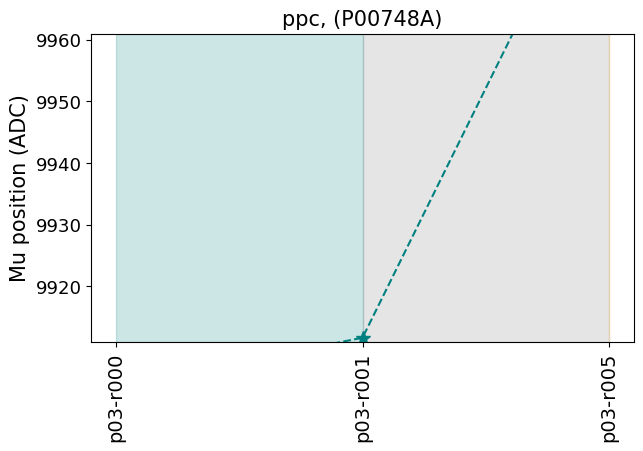

ch1089604


In [29]:
for channel in all_params_ch.keys():
    try:
        compute_and_plot_partition(channel, all_fitted_peaks[6])
    except KeyError:
        print(channel)
        continue

ch1110405
ch1080003
ch1088000
ch1088004
ch1089602
ch1089604


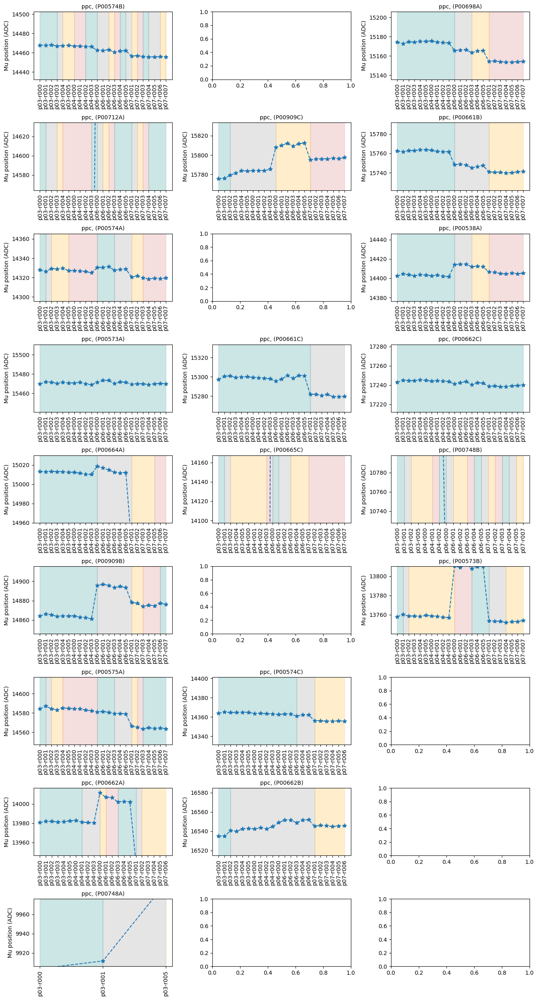

In [30]:
peak = all_fitted_peaks[6]
fig, axs = plt.subplots(int(np.ceil(len(all_params_ch)/3)), 3, figsize=(13.5, 25))
for i, (ax, channel) in enumerate(zip(axs.flatten(), all_params_ch.keys())):
    try:
        mus    = list(all_params_ch[channel]['mus_peaks'][peak].values())
        sigmas = np.array([list(el.values())[0] for el in all_params_ch[channel]['Qbb_fwhms_in_ADC']])/2.355
        
        partition_change = [0]
        start_mu = 0
        for i,(mu,sig) in enumerate(zip(mus, sigmas)):
            if i==0:
                start_mu = mu
            else:
                if np.abs(mu - start_mu) > np.abs(sig):
                    partition_change.append(i)
                start_mu = mu
        partition_change.append(len(mus)-1)
        
        det_type = channel_dict[int(channel[2:])][0]
        det_name = channel_dict[int(channel[2:])][1]
        ax.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
                    list(all_params_ch[channel]['mus_peaks'][peak].values()),
                    yerr=list(all_params_ch[channel]['mus_err_peaks'][peak].values()), 
                    marker='*', linestyle='--', markersize=8, label=det_type)

        color_list   = ['teal', 'grey', 'orange', 'indianred']
        for i,col in zip(range(len(partition_change)-1), cycle(color_list)):
            ax.axvspan(list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change[i]], 
                       list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change[i+1]], alpha=0.2, color=col)
        ax.tick_params(axis='x', labelsize=10, rotation=90)
        ax.tick_params(axis='y', labelsize=10)
        ax.set_title(f'{det_type}, ({det_name})', fontsize=10)
        ax.set_ylabel('Mu position (ADC)', fontsize=10)
        ax.set_ylim(np.mean(list(all_params_ch[channel]['mus_peaks'][peak].values()))-30,
                    np.mean(list(all_params_ch[channel]['mus_peaks'][peak].values()))+40)
    except KeyError:
        print(channel)
        continue
    
plt.tight_layout()    
plt.show()

In [31]:
good_channels = ['ch1110404', 'ch1112000', 'ch1112001', 'ch1112002', 'ch1112003', 'ch1112004', 'ch1080004',
                 'ch1080005', 'ch1081600', 'ch1081601', 'ch1081602', 'ch1081603', 'ch1081604', 'ch1081605',
                 'ch1088001', 'ch1088002', 'ch1088003', 'ch1089600', 'ch1089601', 'ch1089603']

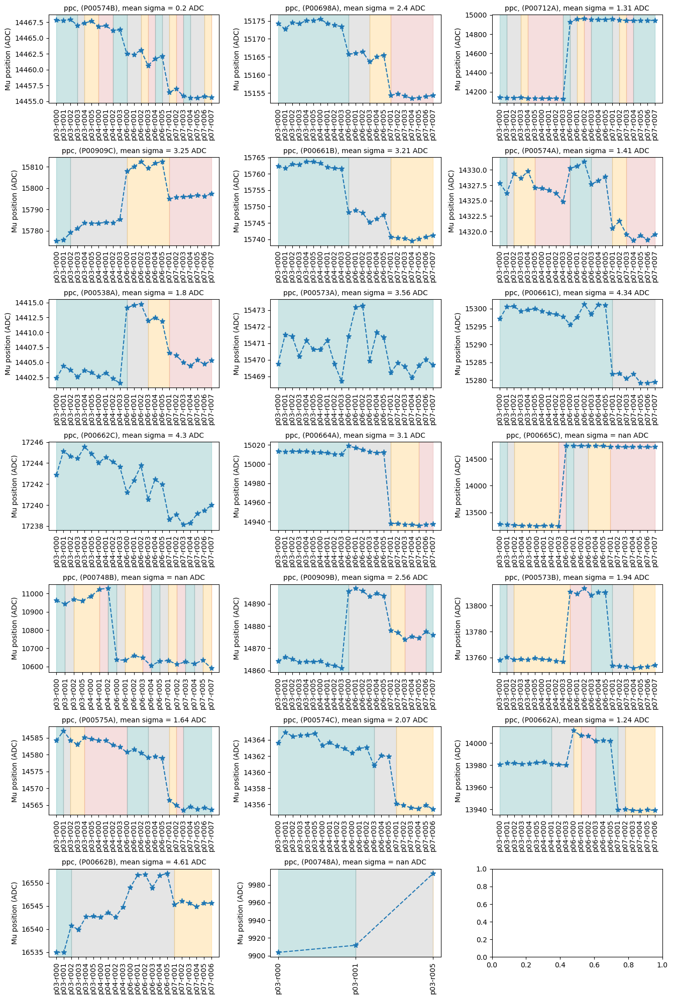

In [32]:
peak = all_fitted_peaks[6]
fig, axs = plt.subplots(int(np.ceil(len(good_channels)/3)), 3, figsize=(13.5, 20))
for i, (ax, channel) in enumerate(zip(axs.flatten(), good_channels)):
    try:
        mus    = list(all_params_ch[channel]['mus_peaks'][peak].values())
        sigmas = np.array([list(el.values())[0] for el in all_params_ch[channel]['Qbb_fwhms_in_ADC']])/2.355
        
        partition_change = [0]
        start_mu = 0
        for i,(mu,sig) in enumerate(zip(mus, sigmas)):
            if i==0:
                start_mu = mu
            else:
                if np.abs(mu - start_mu) > np.abs(sig):
                    partition_change.append(i)
                start_mu = mu
        partition_change.append(len(mus)-1)
        
        det_type = channel_dict[int(channel[2:])][0]
        det_name = channel_dict[int(channel[2:])][1]
        ax.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
                    list(all_params_ch[channel]['mus_peaks'][peak].values()),
                    yerr=list(all_params_ch[channel]['mus_err_peaks'][peak].values()), 
                    marker='*', linestyle='--', markersize=8, label=det_type)
        for i,col in zip(range(len(partition_change)-1), cycle(color_list)):
            ax.axvspan(list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change[i]], 
                       list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change[i+1]], alpha=0.2, color=col)
        ax.tick_params(axis='x', labelsize=10, rotation=90)
        ax.tick_params(axis='y', labelsize=10)
        #ax.set_title(f'{det_type}, ({det_name})', fontsize=10)
        ax.set_title(f'{det_type}, ({det_name}), mean sigma = {np.round(np.mean(sigmas), decimals=2)} ADC', fontsize=10)
        ax.set_ylabel('Mu position (ADC)', fontsize=10)
        #ax.set_ylim(np.mean(list(all_params_ch[channel]['mus_peaks'][peak].values()))-50,
        #            np.mean(list(all_params_ch[channel]['mus_peaks'][peak].values()))+50)
    except KeyError:
        continue
    
plt.tight_layout()    
plt.show()

### Try with the mean of sigma E res

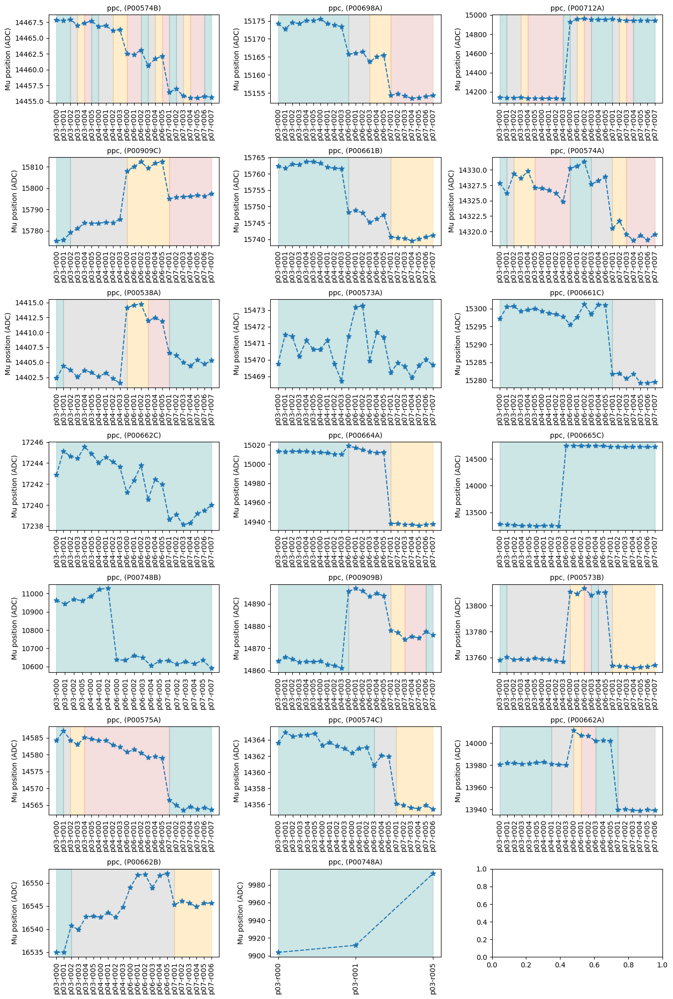

In [33]:
peak = all_fitted_peaks[6]
fig, axs = plt.subplots(int(np.ceil(len(good_channels)/3)), 3, figsize=(13.5, 20))
for i, (ax, channel) in enumerate(zip(axs.flatten(), good_channels)):
    try:
        mus    = list(all_params_ch[channel]['mus_peaks'][peak].values())
        sigmas = np.array([list(el.values())[0] for el in all_params_ch[channel]['Qbb_fwhms_in_ADC']])/2.355
        
        partition_change = [0]
        start_mu = 0
        for i,(mu,sig) in enumerate(zip(mus, sigmas)):
            if i==0:
                start_mu = mu
            else:
                if np.abs(mu - start_mu) > np.mean(sigmas):
                    partition_change.append(i)
                start_mu = mu
        partition_change.append(len(mus)-1)
        
        det_type = channel_dict[int(channel[2:])][0]
        det_name = channel_dict[int(channel[2:])][1]
        ax.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
                    list(all_params_ch[channel]['mus_peaks'][peak].values()),
                    yerr=list(all_params_ch[channel]['mus_err_peaks'][peak].values()), 
                    marker='*', linestyle='--', markersize=8, label=det_type)
        for i,col in zip(range(len(partition_change)-1), cycle(color_list)):
            ax.axvspan(list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change[i]], 
                       list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change[i+1]], alpha=0.2, color=col)
        ax.tick_params(axis='x', labelsize=10, rotation=90)
        ax.tick_params(axis='y', labelsize=10)
        ax.set_title(f'{det_type}, ({det_name})', fontsize=10)
        ax.set_ylabel('Mu position (ADC)', fontsize=10)
        #ax.set_ylim(np.mean(list(all_params_ch[channel]['mus_peaks'][peak].values()))-50,
        #            np.mean(list(all_params_ch[channel]['mus_peaks'][peak].values()))+50)
    except KeyError:
        continue
    
plt.tight_layout()    
plt.show()

### Doubtful channels

In [34]:
for i,k in enumerate(all_params_ch.keys()):
    if i==0:
        print(k)

ch1110404


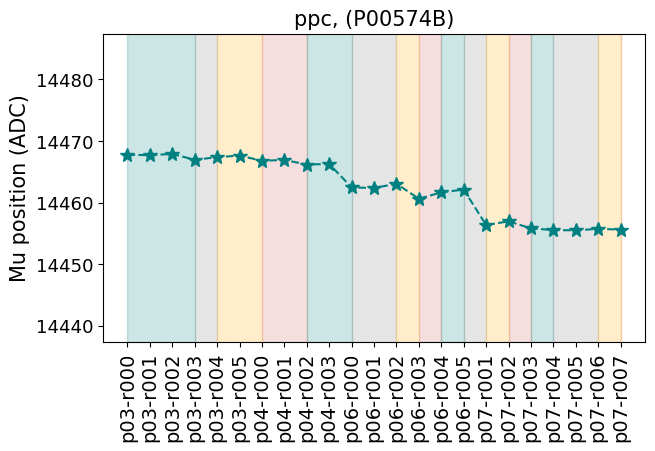

In [35]:
compute_and_plot_partition('ch1110404', all_fitted_peaks[6])
#compute_and_plot_partition('ch1083202', all_fitted_peaks[6], ylim=(12500, 14000))
#compute_and_plot_partition('ch1118402', all_fitted_peaks[6])
#compute_and_plot_partition('ch1121602', all_fitted_peaks[6], ylim=(13750, 13770))
#compute_and_plot_partition('ch1078400', all_fitted_peaks[6])

ch1110405
ch1080003
ch1081603
ch1081604
ch1088000
ch1088004
ch1089602
ch1089603
ch1089604


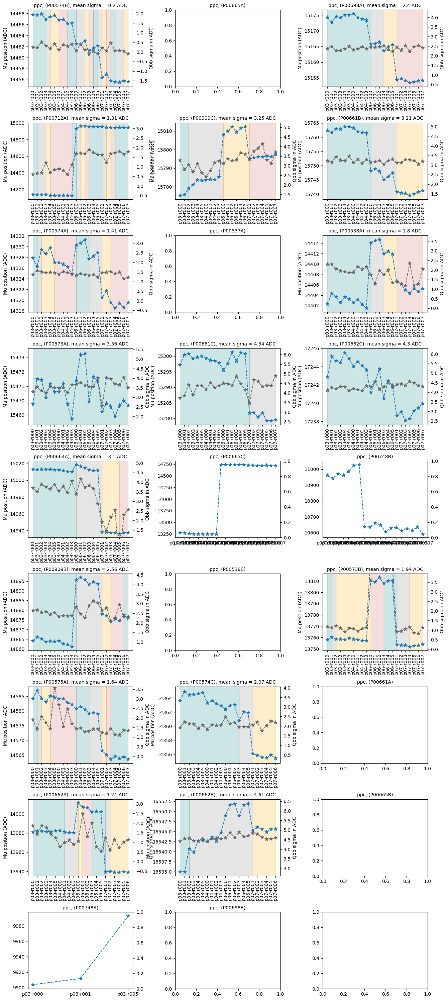

In [36]:
peak = all_fitted_peaks[6]
fig, axs = plt.subplots(int(np.ceil(len(all_params_ch)/3)), 3, figsize=(13.5, 30))
for i, (ax, channel) in enumerate(zip(axs.flatten(), all_params_ch.keys())):
    try:
        mus    = list(all_params_ch[channel]['mus_peaks'][peak].values())
        sigmas = np.array([list(el.values())[0] for el in all_params_ch[channel]['Qbb_fwhms_in_ADC']])/2.355
        
        partition_change = [0]
        start_mu = 0

        for i,(mu,sig) in enumerate(zip(mus, sigmas)):
            if i==0:
                start_mu = mu
            else:
                if np.abs(mu - start_mu) > np.abs(sig):
                    partition_change.append(i)
                start_mu = mu
        #for i,mu in enumerate(mus):
        #    if i==0:
        #        start_mu = mu
        #    else:
        #        if np.abs(mu - start_mu) > np.mean(sigmas):
        #            partition_change.append(i)
        #        start_mu = mu
        partition_change.append(len(mus)-1)
        
        det_type = channel_dict[int(channel[2:])][0]
        det_name = channel_dict[int(channel[2:])][1]
        ax.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
                    list(all_params_ch[channel]['mus_peaks'][peak].values()),
                    yerr=list(all_params_ch[channel]['mus_err_peaks'][peak].values()), 
                    marker='*', linestyle='--', markersize=8, label=det_type)
        ax2 = ax.twinx()
        ax2.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
                     sigmas, marker='*', linestyle='--', markersize=8, color='dimgrey')
        for i,col in zip(range(len(partition_change)-1), cycle(color_list)):
            ax.axvspan(list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change[i]], 
                       list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change[i+1]], alpha=0.2, color=col)
        ax.tick_params(axis='x', labelsize=10, rotation=90)
        ax.tick_params(axis='y', labelsize=10)
        ax.set_title(f'{det_type}, ({det_name}), mean sigma = {np.round(np.mean(sigmas), decimals=2)} ADC', fontsize=10)
        ax .set_ylabel('Mu position (ADC)', fontsize=10)
        ax2.set_ylabel('Qbb sigma in ADC',  fontsize=10)
        #ax.set_ylim(np.mean(list(all_params_ch[channel]['mus_peaks'][peak].values()))-50,
        #            np.mean(list(all_params_ch[channel]['mus_peaks'][peak].values()))+50)
        ax2.set_ylim(np.mean(sigmas)-2, np.mean(sigmas)+2)
    except KeyError:
        det_name = channel_dict[int(channel[2:])][1]
        ax.set_title(f'{det_type}, ({det_name})', fontsize=10)
        print(channel)
        continue
    except ValueError:
        det_name = channel_dict[int(channel[2:])][1]
        ax.set_title(f'{det_type}, ({det_name})', fontsize=10)
        print(channel)
        continue
    
plt.tight_layout()    
plt.show()

[0, 3, 4, 6, 8, 10, 12, 13, 14, 15, 16, 17, 18, 19, 21, 22, 22] [0, 2, 3, 4, 5, 6, 8, 10, 12, 13, 14, 15, 16, 17, 18, 19, 21, 22]


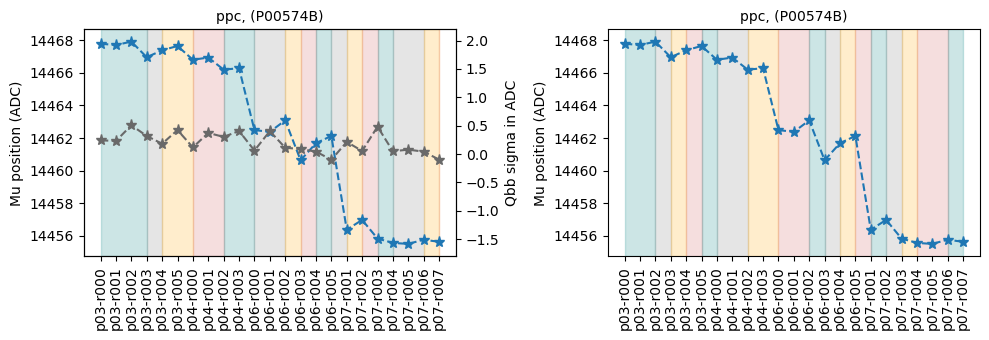

ch1110405
ch1080003
[0, 10, 13, 16, 22] [0, 1, 10, 13, 16, 22]


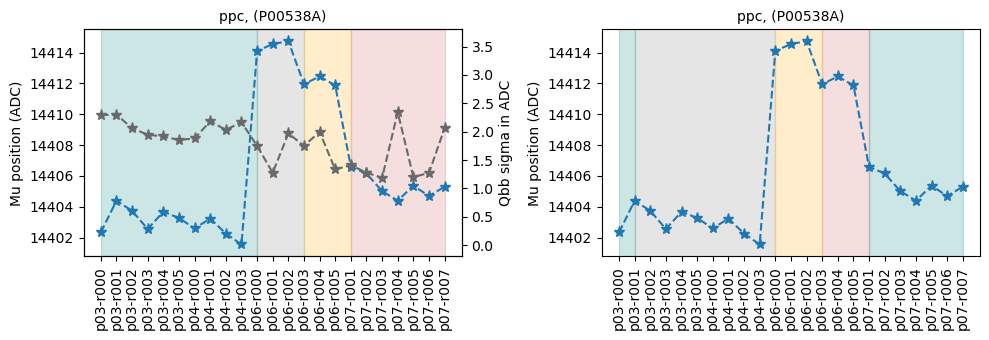

[0, 10, 16, 20, 22] [0, 10, 16, 22]


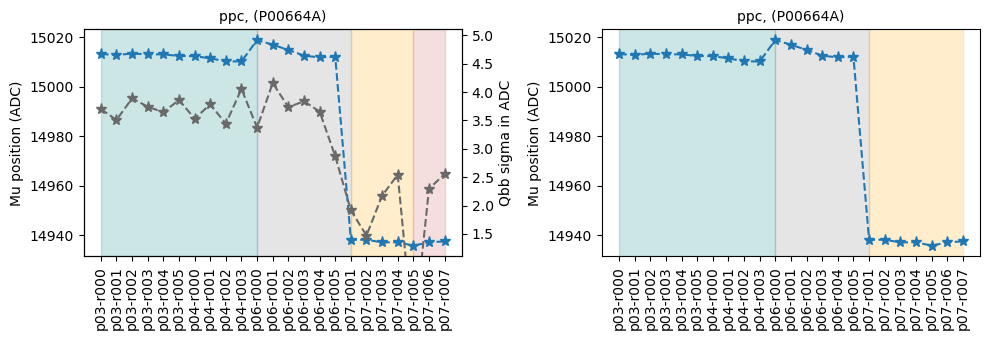

ch1081603
ch1081604
ch1088000
[0, 1, 2, 10, 13, 16, 19, 22] [0, 1, 10, 12, 13, 14, 16, 22]


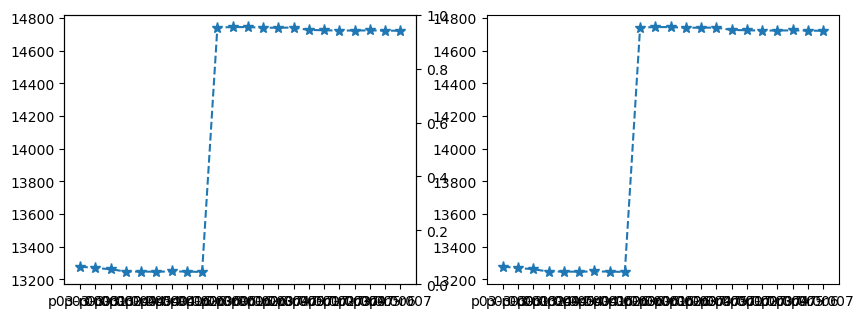

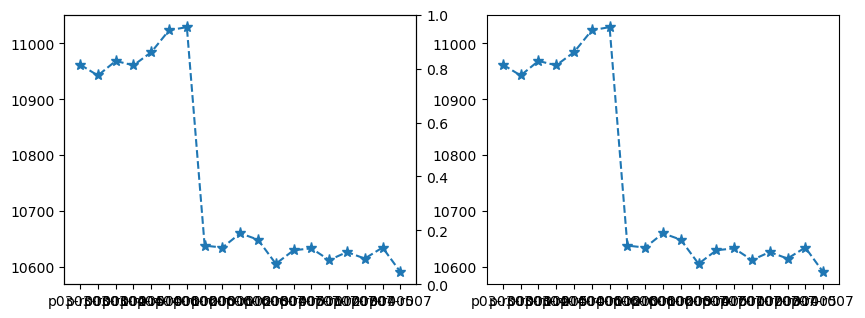

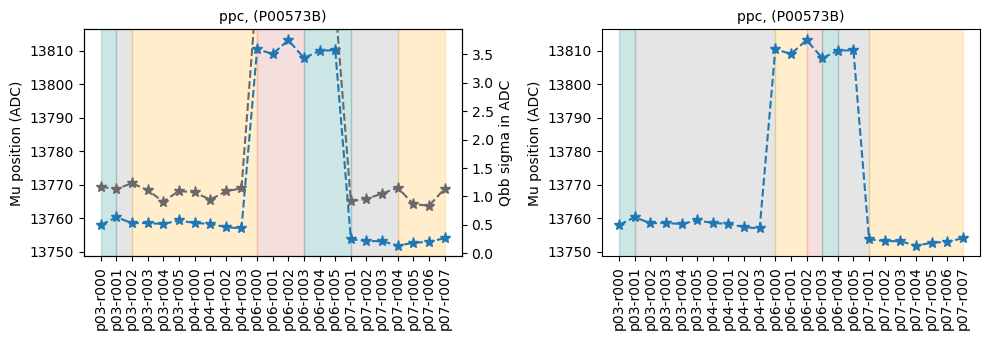

[0, 1, 2, 4, 10, 13, 16, 17, 18, 22] [0, 1, 2, 4, 16, 22]


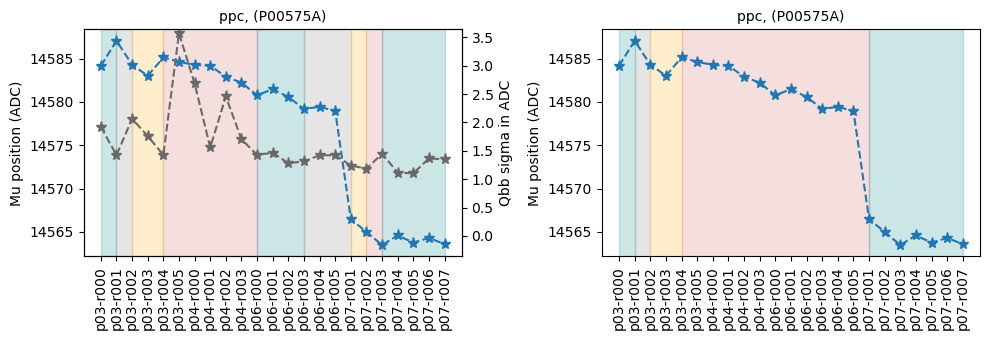

ch1088004
[0, 7, 10, 11, 13, 16, 17, 21] [0, 7, 10, 11, 13, 16, 21]


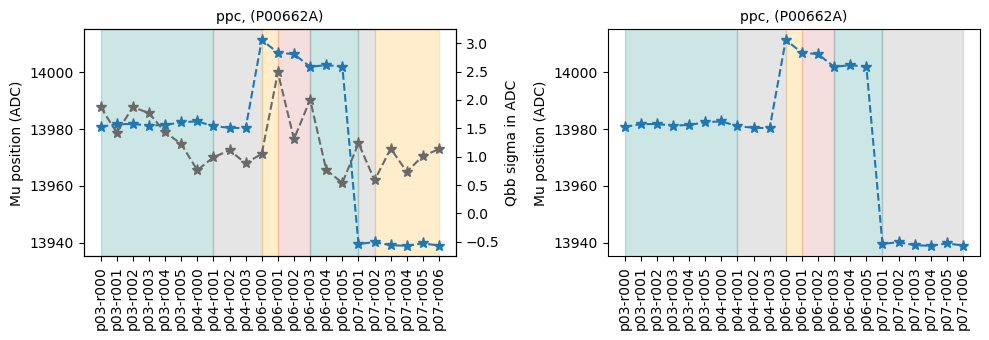

ch1089602
ch1089603
ch1089604


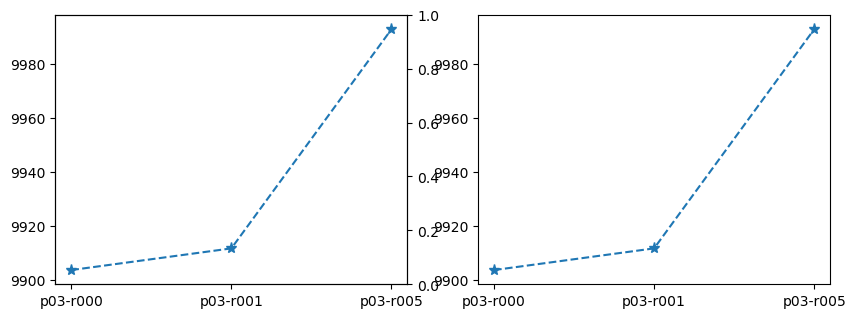

In [37]:
peak = all_fitted_peaks[6]
for i, channel in enumerate(all_params_ch.keys()):
    #if i>1:
    #    continue
    try:
        mus    = list(all_params_ch[channel]['mus_peaks'][peak].values())
        sigmas = np.array([list(el.values())[0] for el in all_params_ch[channel]['Qbb_fwhms_in_ADC']])/2.355
        
        partition_change0 = [0]
        partition_change1 = [0]
        start_mu0 = 0
        start_mu1 = 0

        for i,(mu,sig) in enumerate(zip(mus, sigmas)):
            if i==0:
                start_mu0 = mu
            else:
                if np.abs(mu - start_mu0) > np.abs(sig):
                    partition_change0.append(i)
                start_mu0 = mu
        partition_change0.append(len(mus)-1)
        for i,mu in enumerate(mus):
            if i==0:
                start_mu1 = mu
            else:
                if np.abs(mu - start_mu1) > np.mean(sigmas):
                    partition_change1.append(i)
                start_mu1 = mu
        partition_change1.append(len(mus)-1)
        
        det_type = channel_dict[int(channel[2:])][0]
        det_name = channel_dict[int(channel[2:])][1]
        
        if partition_change0 == partition_change1:
            continue
        fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(10, 3.5))
        ax0.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
                     list(all_params_ch[channel]['mus_peaks'][peak].values()),
                     yerr=list(all_params_ch[channel]['mus_err_peaks'][peak].values()), 
                     marker='*', linestyle='--', markersize=8, label=det_type)
        ax1.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
                     list(all_params_ch[channel]['mus_peaks'][peak].values()),
                     yerr=list(all_params_ch[channel]['mus_err_peaks'][peak].values()), 
                     marker='*', linestyle='--', markersize=8, label=det_type)
        ax2 = ax0.twinx()
        ax2.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
                     sigmas, marker='*', linestyle='--', markersize=8, color='dimgrey')

        print(partition_change0, partition_change1)
        for i,col in zip(range(len(partition_change0)-1), cycle(color_list)):
            ax0.axvspan(list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change0[i]], 
                        list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change0[i+1]], alpha=0.2, color=col)
        for i,col in zip(range(len(partition_change1)-1), cycle(color_list)):
            ax1.axvspan(list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change1[i]], 
                        list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change1[i+1]], alpha=0.2, color=col)
        ax0.tick_params(axis='x', labelsize=10, rotation=90)
        ax0.tick_params(axis='y', labelsize=10)
        ax0.set_title(f'{det_type}, ({det_name})', fontsize=10)
        ax0 .set_ylabel('Mu position (ADC)', fontsize=10)
        ax1.tick_params(axis='x', labelsize=10, rotation=90)
        ax1.tick_params(axis='y', labelsize=10)
        ax1.set_title(f'{det_type}, ({det_name})', fontsize=10)
        ax1 .set_ylabel('Mu position (ADC)', fontsize=10)
        ax2.set_ylabel('Qbb sigma in ADC',  fontsize=10)
        #ax.set_ylim(np.mean(list(all_params_ch[channel]['mus_peaks'][peak].values()))-50,
        #            np.mean(list(all_params_ch[channel]['mus_peaks'][peak].values()))+50)
        ax2.set_ylim(np.mean(sigmas)-2, np.mean(sigmas)+2)
    except KeyError:
        print(channel)
        continue
    except ValueError:
        print(channel)
        continue
    plt.tight_layout()    
    plt.show()

### Test

In [45]:
len(all_params_ch['ch1112000']['mus_peaks'][2614.5].keys()), len(all_params_ch['ch1112000']['mus_peaks'][2614.5].values())

(23, 23)

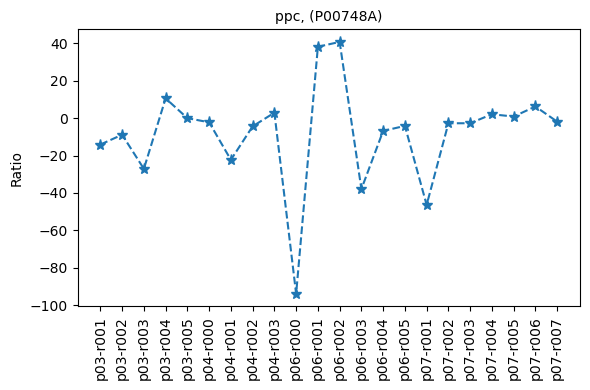

In [46]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))
channel = 'ch1112000'
peak    = all_fitted_peaks[6]
sigmas  = np.array([list(el.values())[0] for el in all_params_ch[channel]['Qbb_fwhms_in_ADC']])/2.355
ax.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys())[1:], 
            np.diff(list(all_params_ch[channel]['mus_peaks'][peak].values()))/np.diff(sigmas),
            marker='*', linestyle='--', markersize=8, label=det_type)
ax.tick_params(axis='x', labelsize=10, rotation=90)
ax.tick_params(axis='y', labelsize=10)
ax.set_title(f'{det_type}, ({det_name})', fontsize=10)
ax.set_ylabel('Ratio', fontsize=10)
#ax.set_ylim(-5, 2)
plt.tight_layout()    
plt.show()

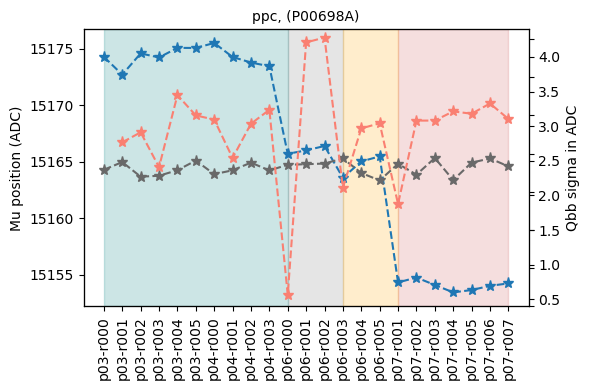

In [47]:
peak    = all_fitted_peaks[6]
mus     = list(all_params_ch[channel]['mus_peaks'][peak].values())
sigmas  = np.array([list(el.values())[0] for el in all_params_ch[channel]['Qbb_fwhms_in_ADC']])/2.355

partition_change = [0]
start_mu = 0

for i,(mu,sig) in enumerate(zip(mus, sigmas)):
    if i==0:
        start_mu = mu
    else:
        if np.abs(mu - start_mu) > np.abs(sig):
            partition_change.append(i)
        start_mu = mu
partition_change.append(len(mus)-1)

det_type = channel_dict[int(channel[2:])][0]
det_name = channel_dict[int(channel[2:])][1]
fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
            list(all_params_ch[channel]['mus_peaks'][peak].values()),
            yerr=list(all_params_ch[channel]['mus_err_peaks'][peak].values()), 
            marker='*', linestyle='--', markersize=8, label=det_type)


ax2 = ax.twinx()
ax2.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
             sigmas, marker='*', linestyle='--', markersize=8, color='dimgrey')

ax3 = ax.twinx()
ax3.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
             np.tile(1000, len(list(all_params_ch[channel]['mus_peaks'][peak].keys()))),
             marker='*', linestyle='--', markersize=8, color='dimgrey')

ax3.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys())[1:], 
            np.diff(list(all_params_ch[channel]['mus_peaks'][peak].values()))/np.diff(sigmas),
            marker='*', linestyle='--', markersize=8, label=det_type, color='salmon')

for i,col in zip(range(len(partition_change)-1), cycle(color_list)):
    ax.axvspan(list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change[i]], 
               list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change[i+1]], alpha=0.2, color=col)
ax.tick_params(axis='x', labelsize=10, rotation=90)
ax.tick_params(axis='y', labelsize=10)
ax.set_title(f'{det_type}, ({det_name})', fontsize=10)
ax .set_ylabel('Mu position (ADC)', fontsize=10)
ax2.set_ylabel('Qbb sigma in ADC',  fontsize=10)
#ax.set_ylim(np.mean(list(all_params_ch[channel]['mus_peaks'][peak].values()))-50,
#            np.mean(list(all_params_ch[channel]['mus_peaks'][peak].values()))+50)
ax2.set_ylim(np.mean(sigmas)-2, np.mean(sigmas)+2)
ax3.set_ylim(-100, 45)
ax3.set_yticklabels([])
plt.tight_layout()    
plt.show()

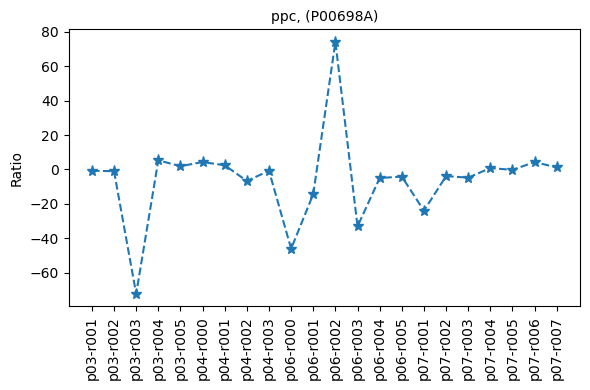

ch1110404


In [48]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))
channel = 'ch1110404'
ax.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys())[1:], 
            np.diff(list(all_params_ch[channel]['mus_peaks'][peak].values()))/np.diff(sigmas),
            marker='*', linestyle='--', markersize=8, label=det_type)
ax.tick_params(axis='x', labelsize=10, rotation=90)
ax.tick_params(axis='y', labelsize=10)
ax.set_title(f'{det_type}, ({det_name})', fontsize=10)
ax.set_ylabel('Ratio', fontsize=10)
#ax.set_ylim(-5, 2)
plt.tight_layout()    
plt.show()
print(channel)

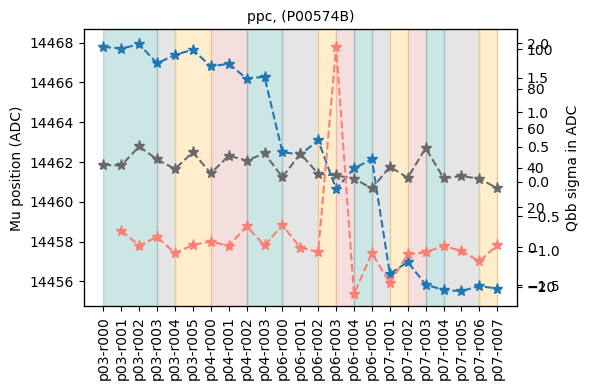

In [49]:
peak    = all_fitted_peaks[6]
channel = 'ch1110404'
mus     = list(all_params_ch[channel]['mus_peaks'][peak].values())
sigmas  = np.array([list(el.values())[0] for el in all_params_ch[channel]['Qbb_fwhms_in_ADC']])/2.355

partition_change = [0]
start_mu = 0

for i,(mu,sig) in enumerate(zip(mus, sigmas)):
    if i==0:
        start_mu = mu
    else:
        if np.abs(mu - start_mu) > np.abs(sig):
            partition_change.append(i)
        start_mu = mu
partition_change.append(len(mus)-1)

det_type = channel_dict[int(channel[2:])][0]
det_name = channel_dict[int(channel[2:])][1]
fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
            list(all_params_ch[channel]['mus_peaks'][peak].values()),
            yerr=list(all_params_ch[channel]['mus_err_peaks'][peak].values()), 
            marker='*', linestyle='--', markersize=8, label=det_type)

ax2 = ax.twinx()
ax2.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
             sigmas, marker='*', linestyle='--', markersize=8, color='dimgrey')

ax3 = ax.twinx()
ax3.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
             np.tile(1000, len(list(all_params_ch[channel]['mus_peaks'][peak].keys()))),
             marker='*', linestyle='--', markersize=8, color='dimgrey')

ax3.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys())[1:], 
            np.diff(list(all_params_ch[channel]['mus_peaks'][peak].values()))/np.diff(sigmas),
            marker='*', linestyle='--', markersize=8, label=det_type, color='salmon')

for i,col in zip(range(len(partition_change)-1), cycle(color_list)):
    ax.axvspan(list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change[i]], 
               list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change[i+1]], alpha=0.2, color=col)
ax.tick_params(axis='x', labelsize=10, rotation=90)
ax.tick_params(axis='y', labelsize=10)
ax.set_title(f'{det_type}, ({det_name})', fontsize=10)
ax .set_ylabel('Mu position (ADC)', fontsize=10)
ax2.set_ylabel('Qbb sigma in ADC',  fontsize=10)
#ax.set_ylim(np.mean(list(all_params_ch[channel]['mus_peaks'][peak].values()))-50,
#            np.mean(list(all_params_ch[channel]['mus_peaks'][peak].values()))+50)
ax2.set_ylim(np.mean(sigmas)-2, np.mean(sigmas)+2)
ax3.set_ylim(-30, 110)
#ax3.set_yticklabels([])
plt.tight_layout()    
plt.show()

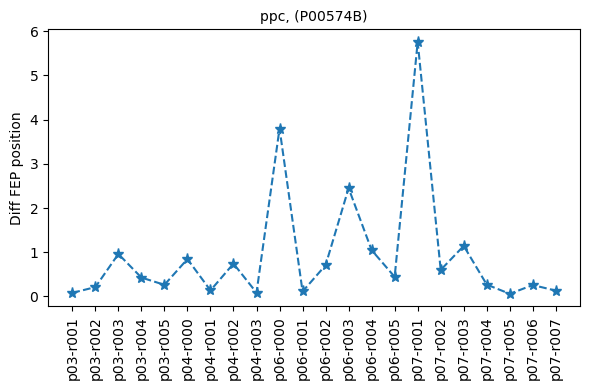

ch1110404


In [50]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))
channel = 'ch1110404'
ax.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys())[1:], 
            np.abs(np.diff(list(all_params_ch[channel]['mus_peaks'][peak].values()))),
            marker='*', linestyle='--', markersize=8, label=det_type)
ax.tick_params(axis='x', labelsize=10, rotation=90)
ax.tick_params(axis='y', labelsize=10)
ax.set_title(f'{det_type}, ({det_name})', fontsize=10)
ax.set_ylabel('Diff FEP position', fontsize=10)
#ax.set_ylim(-5, 2)
plt.tight_layout()    
plt.show()
print(channel)

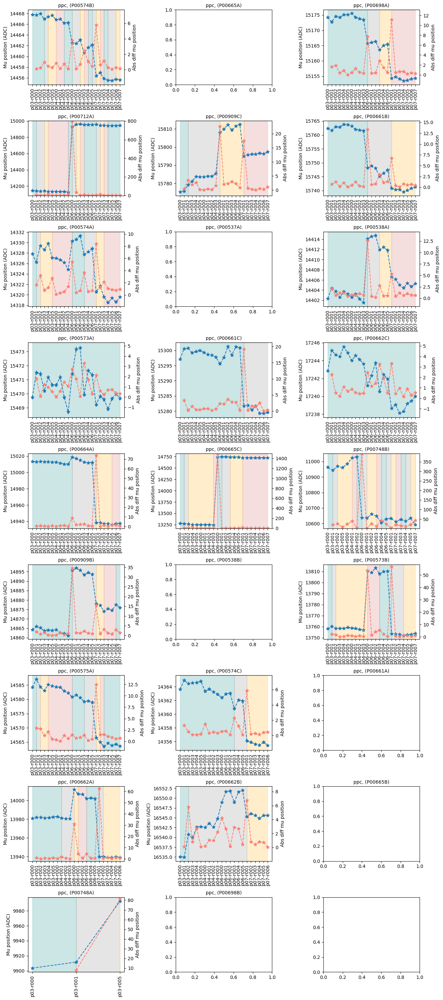

In [51]:
peak = all_fitted_peaks[6]
fig, axs = plt.subplots(int(np.ceil(len(all_params_ch)/3)), 3, figsize=(13.5, 30))
for i, (ax, channel) in enumerate(zip(axs.flatten(), all_params_ch.keys())):
    try:
        mus    = list(all_params_ch[channel]['mus_peaks'][peak].values())
        sigmas = np.array([list(el.values())[0] for el in all_params_ch[channel]['Qbb_fwhms_in_ADC']])/2.355
        
        partition_change = [0]
        start_mu = 0

        for i,(mu,sig) in enumerate(zip(mus, sigmas)):
            if i==0:
                start_mu = mu
            else:
                if np.abs(mu - start_mu) > np.abs(sig):
                    partition_change.append(i)
                start_mu = mu
        partition_change.append(len(mus)-1)
        
        det_type = channel_dict[int(channel[2:])][0]
        det_name = channel_dict[int(channel[2:])][1]
        ax.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
                    list(all_params_ch[channel]['mus_peaks'][peak].values()),
                    yerr=list(all_params_ch[channel]['mus_err_peaks'][peak].values()), 
                    marker='*', linestyle='--', markersize=8, label=det_type)
        ax2 = ax.twinx()
        ax2.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
             np.tile(100000, len(list(all_params_ch[channel]['mus_peaks'][peak].keys()))),
             marker='*', linestyle='--', markersize=8, color='dimgrey')

        ax2.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys())[1:], 
            np.abs(np.diff(list(all_params_ch[channel]['mus_peaks'][peak].values()))),
            marker='*', linestyle='--', markersize=8, color='salmon')
        #ax2.errorbar(list(all_params_ch[channel]['mus_peaks'][peak].keys()), 
        #             sigmas, marker='*', linestyle='--', markersize=8, color='dimgrey')
        for i,col in zip(range(len(partition_change)-1), cycle(color_list)):
            ax.axvspan(list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change[i]], 
                       list(all_params_ch[channel]['mus_peaks'][peak].keys())[partition_change[i+1]], alpha=0.2, color=col)
        ax.tick_params(axis='x', labelsize=10, rotation=90)
        ax.tick_params(axis='y', labelsize=10)
        ax.set_title(f'{det_type}, ({det_name})', fontsize=10)
        ax .set_ylabel('Mu position (ADC)', fontsize=10)
        ax2.set_ylabel('Abs diff mu position',  fontsize=10)
        ax2.set_ylim(np.min(np.abs(np.diff(list(all_params_ch[channel]['mus_peaks'][peak].values())))) - 2,
                     np.max(np.abs(np.diff(list(all_params_ch[channel]['mus_peaks'][peak].values())))) + 2)
    except KeyError:
        det_name = channel_dict[int(channel[2:])][1]
        ax.set_title(f'{det_type}, ({det_name})', fontsize=10)
        continue
    except ValueError:
        det_name = channel_dict[int(channel[2:])][1]
        ax.set_title(f'{det_type}, ({det_name})', fontsize=10)
        continue
    
plt.tight_layout()    
plt.show()